## **Pump it Up: Data Mining the Water Table**
Trabajo final del módulo de Machine Learning (08 de mayo de 2025)  
por **Antonio Luis Martínez Trapote**

Todos los datos utilizados en el notebook provienen de:  
DrivenData. (2015). Pump it Up: Data Mining the Water Table. Retrieved [Marzo 18 2025] from https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table.

**Importante**: Este notebook contiene imágenes insertadas como adjuntos (attachments) que pueden no visualizarse correctamente en Google Colab. Se recomienda abrirlo en Jupyter Notebook o VS Code para ver todos los gráficos e imágenes.

**Importante**: A lo largo del notebook hay muchos bloques y partes de código comentadas con # , porque la intención ha sido dejar reflejados todos los intentos o pasos intermedios. Si se quiere ejecutar todo el notebook tal y como está no debería haber ningún problema. Pero si se quieren probar bloques actualmente desactivados, será preciso prestar atención a los comentarios, porque estos bloques pueden afectar al correcto funcionamiento de bloques posteriores (o pueden necesitar de bloques comentados anteriores).

In [486]:
import pandas as pd
import numpy as np

### **Importamos los datos**

In [487]:
# Importamos los datos de entrenamiento (variables -X- y target -y-)
X = pd.read_csv('training_values.csv')
y = pd.read_csv('training_labels.csv')

In [488]:
# Chequeamos que los id's son únicos e iguales en X e y
print(X.id.nunique())
print(y.id.nunique())
(X.id == y.id).all()

59400
59400


True

In [489]:
# Unimos X e y por la clave id
train_df = pd.merge(X, y, on='id')

# Seteamos el índice con la clave id
train_df.set_index('id', inplace=True)

# Renombramos la columna 'status_group' por 'target'
train_df.rename(columns={'status_group': 'target'}, inplace=True)

#### ***Unimos el dataset de entrenamiento y el de prediciones, para facilitar el depurado de datos y feature engineering.***

Al principio, estaba aplicando transformaciones (feature engineering) solo al dataset de entrenamiento, pero luego me resultaba bastante complejo replicar todas en el dataset de predicción. Sobre todo engorroso para probar muchas opciones distintas de feature engineering. Así que opté por hacer las transformaciónes sobre conjunto de datos completo.

Soy consciente de que en un entorno de producción real, lo adecuado es elaborar un pipeline con todas las transformaciones que aplicamos al dataset de entrenamiento, de manera que después podamos aplicarselo a cualquier dataset nuevo para hacer predicciones/clasificación. Es una decisisón pragmática.

In [490]:
# Importamos el dataset con los registros a predecir/clasificar.
predict_df = pd.read_csv('test_values.csv')

# Chequeamos que no hay ningun id duplicado entre predict_df y train_df
print((predict_df.id.isin(train_df.index)).sum())

0


In [491]:
# Añadimos la columna target a predict_df y le asignamos el valor arbitrario 'predict' 
predict_df['target'] = 'predict'

# Unimos predict_df con train_df en full_df (dataset completo).
full_df = pd.concat([train_df, predict_df.set_index('id')], axis=0)

### **Exploratory Data Analysis**
Recurrimos a ProfileReport de ydata_profiling, para facilitar un vistazo general de todas las variables. Y así analizar tipos, distribuciones, presencia de nulos, etc. 

In [595]:
from ydata_profiling import ProfileReport

profile = ProfileReport(full_df, title='Well Data Profiling Report', explorative=True)
# profile.to_file("full_profile_report.html")

In [596]:
# Mostrar el reporte en el notebook
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### **Depuracion / preprocesado / Feature Engineering**

Por lo observado en el EDA realizado con ydata_profiling, decidimos eliminar directamente las variables:  
- 'num_private', porque tiene un 98% de ceros.
- 'recorded_by', porque tienen un valor único "GeoData Conultants Ltd".
- 'scheme_name', porque tiene un 48.5% de missings y aportaría información redundante con respecto de 'scheme_management'.  

In [494]:
clean_df = full_df.drop(columns=['num_private', 'recorded_by', 'scheme_name'])

In [495]:
# # Guardamos el dataframe en un archivo CSV para hacer algunas pruebas con pycaret
# clean_df.to_csv('clean_df1.csv')

El resultado de una prueba rápida con pycaret eliminando estas variables es bastante bueno (accuracy = 0.8093), así que conservamos la decisión de eliminarlas.

**Nota**: he hecho algunas pruebas con pycaret en otro proyecto porque en este entorno tenía problemas de compatibildad de versiones. En cualqueir caso, únicamente lo he utilizado para una primera aproximación e iré mencionando el propósito y conclusiones cuando proceda.

Varias cosas a las que prestaremos especial atención:
- amount_tsh 70% de ceros...
- population 36% de ceros...
- construction_year 34.9% de ceros...
- gps_height 34.4% de ceros... 

Hemos probado una aproximación con pycaret eliminando *'amount_tsh', 'population', 'construction_year'* y *'gps_height'* (clean_df2.csv) pero perdemos bastante acuracy, así que las mantendremos en el dataset. Veremos como podemos gestionar esos missings...

### **Listamos variables categóricas y numéricas para trabajarlas por separado**

In [496]:
num_features = clean_df.select_dtypes(include=[np.number]).columns
cat_features = clean_df.select_dtypes(exclude=[np.number]).columns

#### **Variables numéricas**

In [497]:
# Creamos una copia de las variables numéricas para probar modificaciones sin machacar el dataset original
num_features_modified = clean_df[num_features].copy()

In [498]:
# chequeamos la presencia de missings
num_features_modified.isnull().mean().sort_values(ascending=False) 

amount_tsh           0.0
gps_height           0.0
longitude            0.0
latitude             0.0
region_code          0.0
district_code        0.0
population           0.0
construction_year    0.0
dtype: float64

In [499]:
num_features_modified.describe()

,amount_tsh,gps_height,longitude,latitude,region_code,district_code,population,construction_year
count,74250.000000,74250.000000,74250.000000,7.425000e+04,74250.000000,74250.000000,74250.000000,74250.000000
mean,318.685704,665.667313,34.074262,-5.701771e+00,15.265414,5.629077,180.750828,1298.463650
std,2906.762364,692.761033,6.572519,2.944969e+00,17.508907,9.641636,471.086120,952.349375
min,0.000000,-90.000000,0.000000,-1.164944e+01,1.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,33.086819,-8.525675e+00,5.000000,2.000000,0.000000,0.000000
50%,0.000000,364.000000,34.907475,-5.026540e+00,12.000000,3.000000,25.000000,1986.000000
75%,20.000000,1317.000000,37.181685,-3.325058e+00,17.000000,5.000000,215.000000,2004.000000
max,350000.000000,2777.000000,40.345193,-2.000000e-08,99.000000,80.000000,30500.000000,2013.000000


Aparentemente no hay valores perdidos, pero tenemos motivos para pensar que encontraremos valores perdidos enmascarados (observamos distribuciones bastante sospechosas en el EDA). Los iremos viendo variable por variable.

##### **echamos un vistazo a los outliers...**

Primero definimos las funciones que utilizaremos para la gestión de outliers. (Las hemos reciclado del módulo de minería de datos con Guillermo Villarino)

In [500]:
def winsorize_with_pandas(s, limits):
    """
    s : pd.Series
        Series to winsorize
    limits : tuple of float
        Tuple of the percentages to cut on each side of the array, 
        with respect to the number of unmasked data, as floats between 0. and 1
    """
    return s.clip(lower=s.quantile(limits[0], interpolation='lower'),
                  upper=s.quantile(1-limits[1], interpolation='higher'))


# Función para gestionar outliers
def gestion_outliers(col, clas='check'):
    """ Función para gestionar outliers en un DataFrame."""
    print(col.name)
    # Condición de asimetría y aplicación de criterio 1 según el caso
    if abs(col.skew()) < 1:
        criterio1 = abs((col-col.mean())/col.std()) > 3
    else:
        criterio1 = abs((col-col.median()) /
                        np.median(abs(col - col.median()))) > 8

    # Calcular Q1
    q1 = col.quantile(0.25)
    # Calcular Q3
    q3 = col.quantile(0.75)
    # Calculo de iqr
    iqr = q3-q1
    # Calcular criterio 2 (general para cualquier asimetría)
    criterio2 = (col < (q1 - 3*iqr)) | (col > (q3 + 3*iqr))
    lower = col[criterio1 & criterio2 & (
        col < q1)].count()/col.dropna().count()
    upper = col[criterio1 & criterio2 & (
        col > q3)].count()/col.dropna().count()

    # Salida según el tipo deseado
    if clas == 'check':
        return (lower*100, upper*100, (lower+upper)*100)
    elif clas == 'winsor':
        return (winsorize_with_pandas(col, (lower, upper)))
    elif clas == 'miss':
        print('\n MissingAntes: ' + str(col.isna().sum()))
        col.loc[criterio1 & criterio2] = np.nan
        print('MissingDespues: ' + str(col.isna().sum()) + '\n')
        return (col)

In [501]:
# Aplicamos la función gestión_outliers en modo 'check' para analizar el porcentaje de outliers en cada variable antes de aplicar ningún cambio
num_features_modified.apply(lambda x: gestion_outliers(x,clas='check'))

amount_tsh
gps_height
longitude
latitude
region_code
district_code
population
construction_year


,amount_tsh,gps_height,longitude,latitude,region_code,district_code,population,construction_year
0,0.000000,0.0,3.055892,0.0,0.000000,0.000000,0.000000,0.0
1,18.747475,0.0,0.000000,0.0,4.284175,6.385185,3.325253,0.0
2,18.747475,0.0,3.055892,0.0,4.284175,6.385185,3.325253,0.0


##### **amount_tsh** 
El 70% de ceros es sospechoso... aunque el funcionamiento del pozo puede ser independientemente de la disponibilidad de agua acumulada, entendemos que estos ceros contienen nulos enmascarados. Eliminar o imputar el 70% de los datos no tendría sentido. Probamos el modelo sin amount_tsh, pero el accuracy baja considerablemente. Así que finalmente optamos por mantener los ceros tal y como están (como si el dato desconocido fuese una 'categoría' en sí misma).

Con respecto a los outliers, probamos varias opciones: 
1. winsorizar los outliers > accuracy: 0,809360 
2. Pasar los outliers a missing y despues los missing a 0 > accuracy 0,809932. Nos quedamos con esta opción
3. No hacer nada con los outliers > accuracy: 0,809360 

Por último, observamos que aún siendo una variable numérica, los valores distintos que toma no son demasiados, por lo tanto valoramos la posibilidad de agruparlos (por decenas) convirtiéndo la variable en una variable numérica discreta. Esta decisión mejora bastante el accuracy. 

In [502]:
# Pasamos a missing los outliers de amount_tsh
gestion_outliers(num_features_modified['amount_tsh'],clas='miss')

# Convertimos estos nuevos missings a '0'
num_features_modified['amount_tsh'] = (num_features_modified['amount_tsh'].fillna(0))

# Mostramos los valores únicos de amount_tsh
num_features_modified['amount_tsh'].value_counts()

amount_tsh

 MissingAntes: 0
MissingDespues: 13920



/var/folders/wm/8fyrq6zs7d3df1m7_fb6rvch0000gn/T/ipykernel_28896/249452307.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  col.loc[criterio1 & criterio2] = np.nan


amount_tsh
0.00     65969
50.00     3103
20.00     1812
10.00      995
30.00      929
5.00       471
25.00      445
6.00       231
7.00        87
40.00       74
70.00       30
33.00       25
60.00       19
2.00        18
15.00       17
35.00       10
0.20         4
1.00         3
53.00        1
26.00        1
9.00         1
0.25         1
12.00        1
59.00        1
3.00         1
0.50         1
Name: count, dtype: int64

In [503]:
# Recodificamos la variable amount_tsh uniendo los valores por decenas
def amounttsh_decenas(x):
    if x == 0:
        return 0
    elif x <= 10:
        return 1
    elif x <= 20:
        return 2
    elif x <= 30:
        return 3
    elif x <= 40:
        return 4
    elif x <= 50:
        return 5
    else:
        return 6
# Aplicamos la función de recodificación
num_features_modified['amount_tsh'] = num_features_modified['amount_tsh'].apply(amounttsh_decenas)
# Comprobamos la recodificación
num_features_modified['amount_tsh'].value_counts()

amount_tsh
0    65969
5     3103
2     1830
1     1813
3     1375
4      109
6       51
Name: count, dtype: int64

In [504]:
# ------ NO ACTIVAR -------
# # pasamos amount_tsh a categórica
# num_features_modified['amount_tsh'] = num_features_modified['amount_tsh'].astype('category')
# # Comprobamos el tipo de variable
# num_features_modified['amount_tsh'].dtype

He probado a pasar la variable a categórica. Y aunque obtengo un accuracy mejor en training, después en competición(test) obtengo un resultado peor. Esto puede ser por el tratamiento interno distinto en CatBoost.

Como numérica: CatBoost lo considerará una feature continua, y hará splits por umbrales en log2(n_bins) de forma muy similar a un árbol normal.

Como categórica: CatBoost aplicará su esquema de encoding de categorías (estadísticas de target con permutaciones internas, count-encoding, etc.). Eso puede afinar demasiado esos pocos bins a la señal del train, mejorando el fit interno pero sobreajustando, de modo que en test (o competición) pierdemos performance.

##### **gps_height**
- Sospechamos de los valores negativos (-90 de mínimo), pero comprobamos que se corresponden con source_class = 'groundwater'. Por lo tanto tienen sentido.
- 34% de ceros: entiendo que esta categoría incluye missings enmascarados. Pero son demasiados para imputarlos por la moda... Pruebo a imputarlos por la moda de cada district_code, pero obtenemos métricas peores. Así que se quedan como están.

No logro dar con ninguna estrategía para depurar esta variable.  
Si eliminamos la variable perdemos accuracy, así que la dejamos como está.

In [505]:
# Mostramos los registros con valores negativos en la variable gps_height
clean_df[num_features_modified['gps_height'] < 0].head(10)


,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,basin,subvillage,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,target
id,,,,,,,,,,,,,,,,,,,,,
41583,0.0,2011-02-23,NaN,-41,NaN,39.812912,-7.889986,Msikitini Wa Ijumaa,Rufiji,Kilombero B,...,salty,salty,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,functional
60983,0.0,2013-03-16,0,-15,0,39.527114,-6.988748,Msikitini,Wami / Ruvu,Madrasa,...,salty,salty,dry,dry,machine dbh,borehole,groundwater,other,other,non functional
68908,0.0,2011-03-05,NaN,-21,NaN,39.670943,-7.906606,Royal,Rufiji,Kigamboni,...,soft,good,enough,enough,machine dbh,borehole,groundwater,communal standpipe,communal standpipe,functional
2136,0.0,2011-02-22,NaN,-16,NaN,39.854320,-7.783063,Mvivini,Rufiji,Jimbo Mjini,...,salty,salty,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,functional
35193,0.0,2011-03-16,Amref,-19,AMREF,39.244178,-7.368293,Kwa,Rufiji,Kimogola,...,soft,good,dry,dry,shallow well,shallow well,groundwater,hand pump,hand pump,non functional
54009,0.0,2011-02-21,NaN,-25,NaN,39.688329,-7.959371,Ukunda,Rufiji,Ukunda,...,soft,good,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,non functional
39704,0.0,2013-02-15,Fini Water,-32,Fini water,40.301987,-10.320959,Kwa Nassoro Ahmad,Ruvuma / Southern Coast,Chihano,...,salty,salty,enough,enough,shallow well,shallow well,groundwater,other,other,non functional
15840,0.0,2013-02-02,Fini Water,-40,Fini Water,40.116768,-10.283676,Bombani Kwa Chananda,Ruvuma / Southern Coast,Mkundi,...,salty,salty,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump,functional needs repair
33963,0.0,2013-02-21,Government Of Tanzania,-19,DWE,39.462112,-8.850923,Chujioni,Ruvuma / Southern Coast,Mtanga,...,soft,good,enough,enough,spring,spring,groundwater,other,other,functional


Probamos a imputar los ceros por la moda de cada district_code... pero obtenemos métricas peores.

In [506]:
# # Calculamos la moda de gps_height por cada district_code sin contar los 0
# gps_height_mode = num_features_modified.loc[num_features_modified['gps_height'] != 0].groupby('district_code')['gps_height'].agg(lambda x: x.mode()[0])
# gps_height_mode.sort_values()

In [507]:
# # Reemplazamos los 0 por la moda de gps_height por district_code
# num_features_modified['gps_height'] = np.where(num_features_modified['gps_height'] == 0,
#                                                 num_features_modified['district_code'].map(gps_height_mode),
#                                                 num_features_modified['gps_height'])

# num_features_modified['gps_height'].value_counts(normalize=True).sort_values(ascending=False)

##### **longitude** 
Identificamos los '0' como missing/nulos enmascarados. Que además están provocando falsos outliers...  
Así que imputamos los nulos (0) por la moda de longitud en cada region.

In [508]:
# Calculamos la moda de 'longitude' por 'region_code'
mode_by_regioncode = clean_df[clean_df['longitude'] != 0].groupby('region_code')['longitude'].agg(lambda x: x.mode().iloc[0])

# Reemplazanos 'longitude' == 0 por la moda correspondiente según region_code
mask = num_features_modified['longitude'] == 0
num_features_modified.loc[mask, 'longitude'] = num_features_modified.loc[mask, 'region_code'].map(mode_by_regioncode)

##### **latitude**
Identificamos los '-2.000000e-08' como missing/nulos enmascarados. 
Así que los imputamos de nuevo por la moda de longitud de cada region.

In [509]:
# Asignamos la moda de 'latitude' por 'region_code' a los valores 'latitude' == -2.000000e-08
latitudes = clean_df[clean_df['latitude'] != -2.000000e-08].groupby('region_code')['latitude'].agg(lambda x: x.mode().iloc[0])

# Reemplazar latitudes == -2.000000e-08 por la moda correspondiente según region_code
mask = num_features_modified['latitude'] == -2.000000e-08
num_features_modified.loc[mask, 'latitude'] = num_features_modified.loc[mask, 'region_code'].map(latitudes)

##### **region_code**
Sospechamos que los outliers, pueden ser erratas. Así que comprobamos la moda de 'region' por cada 'region_code'.  
Observamos que, efectivamente, Arusha, Pwani, Lindi y Mtwara se repiten a partir de la región 24. Recodificamos estos valores.

Finalmente no he utilizado esta variable en el modelo. (la eliminamos del dataset más adelante)

In [510]:
num_features_modified['region_code'].value_counts().sort_index(ascending=True)

region_code
1     2779
2     3709
3     5494
4     3145
5     5079
6     2032
7     1020
8      375
9      499
10    3306
11    6608
12    5759
13    2536
14    2488
15    2242
16    3533
17    6334
18    4183
19    3824
20    2451
21    1972
24     402
40       1
60    1298
80    1536
90    1133
99     512
Name: count, dtype: int64

In [511]:
# mostramos la moda de 'region' por cada 'region_code'
mode_by_regioncode = clean_df[clean_df['region'] != 'unknown'].groupby('region_code')['region'].agg(lambda x: x.mode().iloc[0])
mode_by_regioncode.sort_index(ascending=True)

region_code
1            Dodoma
2            Arusha
3       Kilimanjaro
4             Tanga
5          Morogoro
6             Pwani
7     Dar es Salaam
8             Lindi
9            Mtwara
10           Ruvuma
11           Iringa
12            Mbeya
13          Singida
14           Tabora
15            Rukwa
16           Kigoma
17        Shinyanga
18           Kagera
19           Mwanza
20             Mara
21          Manyara
24           Arusha
40            Pwani
60            Pwani
80            Lindi
90           Mtwara
99           Mtwara
Name: region, dtype: object

In [512]:
# creamos un mapa con los valores de rgion_code que queremos cambiar
region_code_map = { 24: 2, 40: 6, 60: 6, 80: 8, 90: 9, 99: 9 }
# Reemplazamos los valores de region_code según el mapa
num_features_modified['region_code'] = num_features_modified['region_code'].replace(region_code_map)

# Comprobamos los cambios
num_features_modified['region_code'].value_counts().sort_index(ascending=True)

region_code
1     2779
2     4111
3     5494
4     3145
5     5079
6     3331
7     1020
8     1911
9     2144
10    3306
11    6608
12    5759
13    2536
14    2488
15    2242
16    3533
17    6334
18    4183
19    3824
20    2451
21    1972
Name: count, dtype: int64

##### **district_code**
La mantenemos tal cual

In [513]:
num_features_modified['district_code'].value_counts().sort_index(ascending=True)

district_code
0        27
1     15299
2     13929
3     12521
4     11253
5      5428
6      5108
7      4166
8      1282
13      496
23      360
30     1256
33     1063
43      653
53      921
60       76
62      127
63      264
67        8
80       13
Name: count, dtype: int64

##### **population**
-Tenemos un problema con ese 36.1% de ceros... No encuentro la manera de imputarlos.

-Además tenemos outliers.  

- Si winsorizamos los outliers cargamos demasiado la cola 
- Probamos a gestionar los outliers, pasandolos a missing, e imputandolos por KNN vecinos... pero obtenemos un accuracy peor. Quizá tiene sentido mantener esos outliers, porque es probable que algunos pozos estén más cercas de núcleo poblacionales de mayor densidad.
- Probamos a pasar los 0 a missing, e imputarlos por KNN... pero tampoco mejora el resutlado.

He probado una transfomación logarítimica para normalizar la distribución de los datos de población. Pero esto no afecta apenas nada a la performance (ni de RandomForest, ni de CatBoost)

Con algoritmos basados en árboles, las transformaciones que solo reescalan de manera monotónica (sin romper el orden) suelen mantener intacta la arquitectura de splits y, por tanto, la accuracy resultante. Por defecto, CatBoost agrupa cada variable numérica en unos cuantos “bins” basados en cuantiles o su propia heurística. Si esos bins internos recaen en prácticamente los mismos rangos con o sin log, las particiones finales de los árboles quedan idénticas

1. Probamos a winsorizar outliers... pero cargamos demasiado lo cola.

In [514]:
# num_features_modified['population'] = gestion_outliers(num_features_modified['population'], clas='winsor')
# num_features_modified['population'].describe()

In [515]:
# # pintamos un histograma de population sin los 0
# import matplotlib.pyplot as plt
# import seaborn as sns
# plt.figure(figsize=(10, 6))
# sns.histplot(num_features_modified[num_features_modified['population'] != 0]['population'], bins=50, kde=True)
# plt.title('Histogram of Population (excluding 0 values)')
# plt.xlabel('Population')
# plt.ylabel('Frequency')
# plt.show()

2. Probamos a pasar los outliers a missings e imputarlos por KNN vecinos. Obtenemos una distribución rara. No nos sirve.

In [516]:
# num_features_modified['population'] = gestion_outliers(num_features_modified['population'], clas='miss')

In [517]:
# # imputamos los perdidos por knn vecinos
# from sklearn.impute import KNNImputer
# # Creamos el objeto KNNImputer
# imputer = KNNImputer(n_neighbors=5)
# # Aplicamos el imputador a la variable population
# imputed_population = imputer.fit_transform(num_features_modified[['population']])
# # Replace the original column with the imputed values
# num_features_modified['population'] = imputed_population

3. Probamos a dejar los outliers, pasar los 0 a missing e imputar estos por KNN vecinos...
No nos ha funcionado tampoco.

In [518]:
# # Pasamos los 0 a missing
# num_features_modified['population'] = num_features_modified['population'].replace(0, np.nan)
# # Imputamos los perdidos por KNN
# from sklearn.impute import KNNImputer
# # Creamos el objeto KNNImputer
# imputer = KNNImputer(n_neighbors=5)
# # Aplicamos el imputador a la variable population
# num_features_modified['population'] = imputer.fit_transform(num_features_modified[['population']])

4. Transformación logarístima de la variable 'population' (No la aplicamos finalmente, no tiene sentido con clasificadores de tipo arbol de decisión)

In [519]:
# # Aplicamos una transformación logarítmica a population
# num_features_modified['population'] = np.log(num_features_modified['population'] + 1)

In [520]:
# # pintamos un histograma de population
# import matplotlib.pyplot as plt
# import seaborn as sns
# plt.figure(figsize=(10, 6))
# sns.histplot(num_features_modified['population'], bins=50, kde=True)
# plt.title('Histogram of Population (excluding 0 values)')
# plt.xlabel('Population')
# plt.ylabel('Frequency')
# plt.show()

##### **construction_year**
- Ojo con el 35% de ceros. No encontramos una estrategia para imputarlos.
- Probamos a agrupar por decenas, para reducir la cardinalidad... pero no funciona esta vez.

In [521]:
num_features_modified['construction_year'].value_counts()

construction_year
0       25969
2010     3314
2008     3243
2009     3196
2000     2578
2007     1960
2006     1892
2011     1591
2003     1579
2004     1417
2012     1347
2002     1343
1995     1283
2005     1275
1978     1267
1999     1222
1998     1190
1985     1177
1990     1176
1996     1020
1980     1005
1984      970
1994      940
1982      926
1972      892
1997      821
1974      814
1992      807
1993      745
2001      680
1988      657
1983      594
1975      561
1986      553
1976      525
1970      493
1991      407
1989      396
1987      370
1981      291
1977      247
1979      245
1973      227
2013      209
1971      177
1960      124
1963      107
1967      106
1968       93
1969       77
1964       48
1962       36
1961       28
1965       21
1966       19
Name: count, dtype: int64

In [522]:
# # recodificamos construction_year por décadas diviendo entre 10 y redondeando
# def recodifica_construction_year(x):
#     if x == 0:
#         return 0
#     else:
#         return round(x // 10) * 10
# # Aplicamos la función de recodificación
# num_features_modified['construction_year'] = num_features_modified['construction_year'].apply(recodifica_construction_year)

# # Comprobamos la recodificación
# num_features_modified['construction_year'].value_counts()

##### **Chequeamos outliers después de las transformaciones**

In [523]:
# Aplicamos la gestión de outliers en modo 'check' para analizar el porcentaje de outliers antes de aplicar ningún cambio
num_features_modified[num_features].apply(lambda x: gestion_outliers(x,clas='check'))

amount_tsh
gps_height
longitude
latitude
region_code
district_code
population
construction_year


,amount_tsh,gps_height,longitude,latitude,region_code,district_code,population,construction_year
0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0
1,11.152862,0.0,0.0,0.0,0.0,6.385185,3.325253,0.0
2,11.152862,0.0,0.0,0.0,0.0,6.385185,3.325253,0.0


#### **Variables categóricas**

In [524]:
# Creamos una copia de las categóricas para probar modificaciones sin machacar el dataset original
cat_features_modified = clean_df[cat_features].copy()

In [525]:
# Contamos el porcentaje de valores nulos en cada columna
cat_features_modified.isnull().mean().sort_values(ascending=False)

scheme_management        0.065279
installer                0.061037
funder                   0.060700
public_meeting           0.055960
permit                   0.051084
subvillage               0.006330
wpt_name                 0.000027
basin                    0.000000
date_recorded            0.000000
ward                     0.000000
lga                      0.000000
region                   0.000000
extraction_type          0.000000
extraction_type_group    0.000000
extraction_type_class    0.000000
management               0.000000
management_group         0.000000
payment                  0.000000
payment_type             0.000000
water_quality            0.000000
quality_group            0.000000
quantity                 0.000000
quantity_group           0.000000
source                   0.000000
source_type              0.000000
source_class             0.000000
waterpoint_type          0.000000
waterpoint_type_group    0.000000
target                   0.000000
dtype: float64

##### **Gestión de missings**
 
- Como no hay demasiados missings. Un 6.5% en la categoría que más tiene. Hemos probado a imputar los missings por la moda en todas las categóricas.  
Esto me funcionó mál en el modelo RandomForest. En el modelo CatBoost, mejoro el accuracy score en el training. Pero cuando subo las predicciones en DataDriven, obtengo un accuracy peor.  
CatBoost maneja los NaN como un valor aparte y puede aprender que “falta información” es en sí un predictor. Al rellenar todos los NaN con la moda, perdemos esa señal: todas las filas que antes compartían “missing” ahora se mezclan con la clase mayoritaria, y eso hace que el modelo se confunda en nuevas muestras en competición/test.

- Optamos por asignar el valor 'unknown' a los missings, y manejarlos como una categoría en sí mimsa. Veremos en cada caso/variable, si encontramos alguna estrategia más apropiada.

In [526]:
# Listamos las categóricas con presencia de valores nulos
nan_cat = ["scheme_management", "installer", "funder", "public_meeting", "permit", "subvillage"] 
# En wpt_name que solo eran dos valores, los imputaré por la moda.

# Sustituimos los valores perdidos por 'unknown'
for col in nan_cat:
    cat_features_modified[col].fillna('unknown', inplace=True)

##### **scheme_managment** 
Reagrupamos categorías minoritarias (con menos representación que 'Other') en 'Other'.

In [527]:
cat_features_modified['scheme_management'].value_counts(normalize=True).sort_values(ascending=False)

scheme_management
VWC                 0.618411
WUG                 0.087488
unknown             0.065279
Water authority     0.053535
WUA                 0.047825
Water Board         0.046626
Parastatal          0.028606
Company             0.018061
Private operator    0.017859
Other               0.013414
SWC                 0.001657
Trust               0.001239
Name: proportion, dtype: float64

In [528]:
# Identificamos las categorías con menos del 1,3% de los valores
minor_categories = cat_features_modified['scheme_management'].value_counts(normalize=True).loc[lambda x: x < 0.013].index

# Reemplazamos las categorías con menos del 13% de los valores en 'Other'
cat_features_modified.loc[cat_features_modified['scheme_management'].isin(minor_categories), 'scheme_management'] = 'Other'

cat_features_modified['scheme_management'].value_counts(normalize=True).sort_values(ascending=False)

scheme_management
VWC                 0.618411
WUG                 0.087488
unknown             0.065279
Water authority     0.053535
WUA                 0.047825
Water Board         0.046626
Parastatal          0.028606
Company             0.018061
Private operator    0.017859
Other               0.016310
Name: proportion, dtype: float64

##### **installer** 
1. Aplicamos algunos métodos básicos de limpieza de strings para evitar categorías erroneas. Soprendentemente algunos de estos métodos (que personalmente aplicaría sin lugar a dudas, si no se tratase de una competición donde el accuracy es el objetivo) empeoran el accuracy del modelo.

2. Recodificamos como 'other' los registros que están por debajo del percentil 98.

3. Descubrimos entonces algunos strings que apuntan a un mismo valor, los recodificamos manualmente. 

Logramos reducir notablemente la cardinalidad de 2162 a 41 categorías.

In [529]:
# Pasamos todas las categorías a minúsculas
cat_features_modified['installer'] = cat_features_modified['installer'].str.lower()

# # OJO !! Sorprendentemente esto empeora el accuracy del modelo !!
# # Eliminamos los espacios en blanco al principio y al final
# cat_features_modified['installer'] = cat_features_modified['installer'].str.strip()
# # Reemplazamos los espacios dobles por un solo espacio
# cat_features_modified['installer'] = cat_features_modified['installer'].str.replace(r'\s+', ' ', regex=True)
# # OJO !! Sorprendentemente esto empeora el accuracy del modelo !!

# Contamos valores únicos
cat_features_modified['installer'].value_counts(normalize=True).sort_values(ascending=False)

installer
dwe               0.293010
unknown           0.061104
government        0.031879
hesawa            0.023811
rwe               0.020175
                    ...   
mombia            0.000013
canaco            0.000013
banane            0.000013
majija charles    0.000013
mukwabi nyeisa    0.000013
Name: proportion, Length: 2162, dtype: float64

In [530]:
# Calculamos el percentil 98 de la columna 'installer'
q98 = cat_features_modified['installer'].value_counts().quantile(0.98)

# Clasificamos como other todos los valores que no superan el percentil 98
installer_counts = cat_features_modified['installer'].value_counts()
cat_features_modified['installer'] = cat_features_modified['installer'].apply(lambda x: 'other' if installer_counts[x] < q98 else x)

# Chequeamos valores únicos
cat_features_modified['installer'].value_counts(normalize=True).sort_values(ascending=False)

installer
dwe                           0.293010
other                         0.287946
unknown                       0.061104
government                    0.031879
hesawa                        0.023811
rwe                           0.020175
commu                         0.018236
danida                        0.017589
district council              0.015906
kkkt                          0.015286
0                             0.013199
central government            0.012566
tcrs                          0.011946
world vision                  0.011677
danid                         0.010586
ces                           0.010303
community                     0.009293
gover                         0.008795
amref                         0.007246
tasaf                         0.007044
lga                           0.006815
wedeco                        0.006707
dmdd                          0.006411
fini water                    0.006330
norad                         0.006061
da             

Observamos que una categoría de las más representadas es '0'.  
Sustituimos pues, los '0' por 'unknown', al fin y al cabo lo que queremos es tratar estos '0' como missings enmascarados.

In [531]:
# Recodificamos los 'installer'=='0' por 'unknown' 
cat_features_modified['installer'] = cat_features_modified['installer'].replace('0', 'unknown')

Unificamos manualmente algunas categorías que nos hemos encontrado al hacer value_counts.

In [532]:
# Recodificamos los 'installer' = ['central government', 'gover'] por 'government'
cat_features_modified['installer'] = cat_features_modified['installer'].replace(['central government', 'gover'], 'government')
# Recodificamos los 'installer'==['commu'] por 'community']
cat_features_modified['installer'] = cat_features_modified['installer'].replace('commu', 'community')

# Chequeamos valores únicos de nuevo
cat_features_modified['installer'].value_counts(normalize=True).sort_values(ascending=False)

installer
dwe                           0.293010
other                         0.287946
unknown                       0.074303
government                    0.053239
community                     0.027529
hesawa                        0.023811
rwe                           0.020175
danida                        0.017589
district council              0.015906
kkkt                          0.015286
tcrs                          0.011946
world vision                  0.011677
danid                         0.010586
ces                           0.010303
amref                         0.007246
tasaf                         0.007044
lga                           0.006815
wedeco                        0.006707
dmdd                          0.006411
fini water                    0.006330
norad                         0.006061
da                            0.005360
twesa                         0.005320
wu                            0.005077
acra                          0.004660
sema           

Por último. Pensé que reagrupar las categorías aún minoritarias en 'other' mejoraria el accuracy, pero no ha funcionado. (lo he probado con distintos umbrales y no he logrado mejoras)

In [533]:
# # recodificamos los valores de 'installer' con menos del 1% de los valores en 'other'
# minor_categories = cat_features_modified['installer'].value_counts(normalize=True).loc[lambda x: x < 0.01].index
# # Reemplazamos las categorías con menos del 1% de los valores en 'other'
# cat_features_modified.loc[cat_features_modified['installer'].isin(minor_categories), 'installer'] = 'other'
# # Chequeamos valores únicos de nuevo
# cat_features_modified['installer'].value_counts(normalize=True).sort_values(ascending=False)

In [534]:
# Contamos los valores únicos de 'installer'
cat_features_modified['installer'].nunique()

41

##### **funder**
* Hacemos una pequeña limpieza de los strings: .lower .strip ... 
* Recodificamos los valores numéricos (que son ceros) como 'unknown'
* Recodificamos todos las valores que están por debajo del percentil 95 como 'other'

Logramos reducir notablemente la cardinalidad. De 2140 a 109 categorías.

In [535]:
cat_features_modified['funder'].value_counts()

funder
Government Of Tanzania    11299
unknown                    4507
Danida                     3907
Hesawa                     2782
Rwssp                      1703
                          ...  
Aljazera                      1
Ci                            1
Colony                        1
Tanzania Na Egypt             1
Tanzania Nea Egypt            1
Name: count, Length: 2140, dtype: int64

In [536]:
# Pasamos todos los valores de la columna 'funder' a minúsculas
cat_features_modified['funder'] = cat_features_modified['funder'].str.lower()
# Eliminamos los espacios en blanco al principio y al final de cada string
cat_features_modified['funder'] = cat_features_modified['funder'].str.strip()
# Eliminamos los espacios en blanco duplicados
cat_features_modified['funder'] = cat_features_modified['funder'].str.replace('  ', ' ')

In [537]:
# Comprobamos si hay valores numéricos en la columna 'funder'
cat_features_modified['funder'].str.isnumeric().sum()
# Mostramos los valores numéricos de la columna 'funder'
cat_features_modified['funder'][cat_features_modified['funder'].str.isnumeric()].value_counts()

# Recodificamos los valores numéricos (que son todos ceros) como 'unknown'
cat_features_modified['funder'] = cat_features_modified['funder'].apply(lambda x: 'unknown' if x.isnumeric() else x)

In [538]:
# Calculamos el percentil 95 de la columna 'funder'
q95 = cat_features_modified['funder'].value_counts().quantile(0.95)

# Mostramos los valores que superan el percentil 95
cat_features_modified['funder'].value_counts()[cat_features_modified['funder'].value_counts() > q95]

funder
government of tanzania    11299
unknown                    5492
danida                     3907
hesawa                     2782
rwssp                      1703
                          ...  
undp                        103
missi                       102
gtz                         102
h                           102
lwi                          99
Name: count, Length: 102, dtype: int64

In [539]:
# Clasificamos como 'other' todos los valores que no superan el percentil 95
funder_counts = cat_features_modified['funder'].value_counts()
cat_features_modified['funder'] = cat_features_modified['funder'].apply(lambda x: 'other' if funder_counts[x] < q95 else x)

In [540]:
cat_features_modified['funder'].value_counts()

funder
other                     13777
government of tanzania    11299
unknown                    5492
danida                     3907
hesawa                     2782
                          ...  
cmsr                         98
fin water                    98
kuwait                       98
vwc                          98
japan                        98
Name: count, Length: 109, dtype: int64

Hemos logrado reducir notablemente la cardinalidad. De 2140 a 109 valores distintos.

##### **public_meeting**

In [541]:
cat_features_modified['public_meeting'].value_counts(normalize=False).sort_values(ascending=False)

public_meeting
True       63749
False       6346
unknown     4155
Name: count, dtype: int64

##### **subvillage**  
Tiene una cardinalidad altísima, sin embargo el modelo la incluye entre las 10 variables más relevantes...

##### **wpt_name**
Tiene una cardinalidad muy alta. Hemos probado muchísimas cosas, pero no logro ni reducir la cardinalidad considerablemente, ni mejorar el score del modelo.  

Unicamente imputamos los 2 únicos NaN que hay en la variable por lo moda.

Intentos que no han funcionado:
- Probamos una normalizacion a nivel de string (lower, strip...) para evitar categorías erroneas innecesarias. Pero no logramos mejoras en el accuracy.
- Estudiamos la posibilidad de reagrupar categorías minoritarias en 'other'
- Por el camino descubirmos que algunos fragmentos de string, pueden ayudarnos a reagrupar categorías, por ejemplo: 'shule', 'polici', 'policei', 'afya', 'hospital'...etc

Después de todo he empeorado el accuracy score, así que mantengo unicamente la imputacion de los 2 missings por la moda.

In [542]:
# imputamos los valores perdidos(que son solo 2) de wpt_name por la moda
cat_features_modified['wpt_name'].fillna(cat_features_modified['wpt_name'].mode()[0], inplace=True)

In [543]:
# cat_features_modified['wpt_name'].value_counts()

intentamos una limpieza de strings, valores numéricos (presumiblemente errores), etc...

In [544]:
# # Pasamos los missing a 'none'
# cat_features_modified['wpt_name'].fillna('none', inplace=True)
# # Pasamos todos los valores de la columna 'wpt_name' a minúsculas
# cat_features_modified['wpt_name'] = cat_features_modified['wpt_name'].str.lower()
# # Eliminamos los espacios en blanco al principio y al final de cada string
# cat_features_modified['wpt_name'] = cat_features_modified['wpt_name'].str.strip()
# # Eliminamos los espacios en blanco duplicados
# cat_features_modified['wpt_name'] = cat_features_modified['wpt_name'].str.replace('  ', ' ')
# # # Comprobamos si hay valores numéricos en la columna 'wpt_name'
# # cat_features_modified['wpt_name'].str.isnumeric().sum()
# # # Mostramos los valores numéricos de la columna 'wpt_name'
# # cat_features_modified['wpt_name'][cat_features_modified['wpt_name'].str.isnumeric()].value_counts()
# # Recodificamos los valores numéricos como 'none'
# cat_features_modified['wpt_name'] = cat_features_modified['wpt_name'].apply(lambda x: 'none' if x.isnumeric() else x)
# # Comprobamos los valores únicos de nuevo
# cat_features_modified['wpt_name'].value_counts(normalize=False).sort_values(ascending=False)

a penas hemos logrado nada...

In [545]:
# # Vamos a mostrar los valores que superan el percentil 99 
# value_counts = cat_features_modified['wpt_name'].value_counts()
# q99 = value_counts.quantile(0.99)
# print(q99)
# value_counts[value_counts > q99]

sigue habiendo demasiadas categorías... vamos a ver las 20 primeras a ver si en algún punto la representación cae drásticamente...

In [546]:
# # Mostramos las 20 categorías más frecuentes
# cat_features_modified['wpt_name'].value_counts(normalize=True).head(20).sort_values(ascending=False)

vaya... nos encontramos shuleni, shule ya msingi, shule... que son lo mismo que school! vamos a tirar del hilo...

In [547]:
# # recodicamos como 'wpt_name'='school' todas las categorías que contienen 'shule'
# cat_features_modified['wpt_name'] = cat_features_modified['wpt_name'].apply(lambda x: 'school' if 'shule' in x else x)
# # Mostramos de nuevo las 20 categorías más frecuentes
# cat_features_modified['wpt_name'].value_counts(normalize=True).head(20).sort_values(ascending=False)

In [548]:
# # mostramos las categorías que superan el 0.001 (0.1%) de los registros
# cat_features_modified['wpt_name'].value_counts(normalize=True).loc[lambda x: x > 0.001].sort_values(ascending=False)

vaya!  de nuevo sospechamos que ofisi, ofisini... pueden ser equivalentes a office

In [549]:
# # mostramos las categorías que contienen 'ofisi' u 'office'
# cat_features_modified['wpt_name'].value_counts(normalize=True).loc[lambda x: x.index.str.contains('ofisi|office')].sort_values(ascending=False)

Sospechamos que la palabra kituo... puede ser una raiz común... tiramos del hilo... es una palabra en suajili. Vamos a ver que encontramos...

In [550]:
# # mostramos las categorías que contienen 'kituo'
# cat_features_modified['wpt_name'].value_counts(normalize=True).loc[lambda x: x.index.str.contains('kituo')].sort_values(ascending=False)

In [551]:
# # Mostrar las categorías que contienen 'afya', 'hospital', 'dispensary', 'health'
# cat_features_modified['wpt_name'].value_counts(normalize=True).loc[lambda x: x.index.str.contains('afya|hospital|dispensary|health')].sort_values(ascending=False)

In [552]:
# # Mostrar las categorías que contienen 'police', 'polisi'
# cat_features_modified['wpt_name'].value_counts(normalize=True).loc[lambda x: x.index.str.contains(r'police|polisi')].sort_values(ascending=False)

In [553]:
# # recodificamos como 'wpt_name'=='office' las categorías que contienen 'ofisi' u 'office'
# cat_features_modified['wpt_name'] = cat_features_modified['wpt_name'].apply(lambda x: 'office' if 'ofisi' in x or 'office' in x else x)
# # recodificamos como 'wpt_name'=='health' las categorías que contienen 'afya', 'hospital', 'dispensary', 'health'
# cat_features_modified['wpt_name'] = cat_features_modified['wpt_name'].apply(lambda x: 'health' if 'afya' in x or 'hospital' in x or 'dispensary' in x or 'health' in x else x)
# # recodificamos como 'wpt_name'=='police' las categorías que contienen 'police', 'polisi'
# cat_features_modified['wpt_name'] = cat_features_modified['wpt_name'].apply(lambda x: 'police' if 'police' in x or 'polisi' in x else x)

In [554]:
# # mostramos de nuevo las categprías  ordenadas por frecuencia, siempre que superen el 0.001 (0.1%) de los registros
# cat_features_modified['wpt_name'].value_counts(normalize=True).loc[lambda x: x > 0.001].sort_values(ascending=False)

In [555]:
# # Identificamos las categorías que superan el 0.1% de frecuencia
# freqs = cat_features_modified['wpt_name'].value_counts(normalize=True)
# valid_categories = freqs[freqs >= 0.001].index

# # Reemplazamos las categorías poco frecuentes por 'other'
# cat_features_modified['wpt_name'] = cat_features_modified['wpt_name'].where(
#     cat_features_modified['wpt_name'].isin(valid_categories), other='other')

Esto ha funcionado fatal, vamos a probar manteniendo las que superan el percentil 99...


In [556]:
# # Identificamos las categorías que superan el percentil 985
# value_counts = cat_features_modified['wpt_name'].value_counts()
# q985 = value_counts.quantile(0.985)
# # Mostramos las categorías que superan el percentil 985
# print(q985)
# # Recodificamos las categorías que no superan el percentil 985 como 'other'
# cat_features_modified['wpt_name'] = cat_features_modified['wpt_name'].apply(lambda x: 'other' if value_counts[x] < q985 else x)
# # Comprobamos los valores únicos de nuevo
# cat_features_modified['wpt_name'].value_counts(normalize=True).sort_values(ascending=False)

In [557]:
# # mostramos un grafico de las 10 categorías con más regsitros en funcion de 'target' 
# plt.figure(figsize=(15, 5))
# sns.countplot(data=cat_features_modified, x='wpt_name', hue='target', order=cat_features_modified['wpt_name'].value_counts().head(10).index)
# plt.xticks(rotation=90)
# plt.title('Distribución de las 15 categorías más frecuentes de wpt_name')
# plt.xlabel('wpt_name')
# plt.ylabel('Frecuencia')
# plt.legend(title='target')
# plt.show()

##### Me planteo en este punto, eliminar algunas variables con una cardinalidad demasiado alta.
Yo elimimnaría wpt_name, porque creo que no aporta ninguna información relevante, no aparece entre las features más importantes del modelo (CatBoost), y además tiene una cardinalidad alitísima. El accuracy en train con y sin esta variable es:
- con wpt_name > 0.8037
- sin 0.8045 > 0.8045 . Sin embargo, la performance del modelo en competicion es peor.

Empiezo a sospechar que puede estar existiendo un problema de sobreajuste del modelo.

In [558]:
# cat_features_modified = cat_features_modified.drop(columns=['wpt_name'])

##### **seguimos con las categóricas...**  
echamos un vistazo general a los valóres únicos por categoría para chequear posibles problemas de alta cardinalidad.

In [559]:
# Mostramos una lista ordenada de manera descendente de los valores únicos de todas las categoricas
cat_features_modified.nunique().sort_values(ascending=False)

wpt_name                 45683
subvillage               21426
ward                      2098
date_recorded              369
lga                        125
funder                     109
installer                   41
region                      21
extraction_type             18
extraction_type_group       13
management                  12
scheme_management           10
source                      10
basin                        9
water_quality                8
waterpoint_type              7
payment                      7
payment_type                 7
extraction_type_class        7
source_type                  7
quality_group                6
waterpoint_type_group        6
quantity_group               5
quantity                     5
management_group             5
target                       4
public_meeting               3
permit                       3
source_class                 3
dtype: int64

##### **date_recorded to year_recorded**

- Pasamos date_recorded a datetime. Nos quedamos únicamente con el año y obtenemos la variable 'year_recorded'.
- Reagrupamos los valores de la nueva variable 'year_recorded' a 2011 en 2011 para limitar las categorías a 3: 2011, 2012 y 2013. 

In [560]:
# Pasamos date_recorded a datetime
cat_features_modified['date_recorded'] = pd.to_datetime(cat_features_modified['date_recorded'])

In [561]:
# Añadimos la columna 'year_recorded' con el año de la fecha de registro
cat_features_modified['year_recorded'] = cat_features_modified['date_recorded'].dt.year

In [562]:
cat_features_modified['year_recorded'].value_counts()

year_recorded
2011    35908
2013    30210
2012     8089
2004       41
2002        1
2001        1
Name: count, dtype: int64

In [563]:
# Unimos los valores de 2004 y 2002 a los de 2011 para evitar categorías con pocos valores.
cat_features_modified['year_recorded'] = cat_features_modified['year_recorded'].apply(lambda x: 2011 if x == 2004 else x)
cat_features_modified['year_recorded'] = cat_features_modified['year_recorded'].apply(lambda x: 2011 if x == 2002 else x)

cat_features_modified['year_recorded'].value_counts()

year_recorded
2011    35950
2013    30210
2012     8089
2001        1
Name: count, dtype: int64

In [564]:
# Eliminamos la columna date_recorded
cat_features_modified.drop(columns=['date_recorded'], inplace=True)

##### **'ward'**
Hacemos una pequeña limpieza de strings pero no logramos nada con esto.

In [565]:
# # pasamos 'ward' a minúsculas
# cat_features_modified['ward'] = cat_features_modified['ward'].str.lower()
# # eliminamos los espacios en blanco al principio y al final
# cat_features_modified['ward'] = cat_features_modified['ward'].str.strip()
# # eliminamos los espacios en blanco duplicados
# cat_features_modified['ward'] = cat_features_modified['ward'].str.replace('  ', ' ')
# # mostramos los valores únicos de 'ward'
# cat_features_modified['ward'].value_counts(normalize=True).sort_values(ascending=False)

##### **'lga'**
Hacemos una pequeña limpieza de strings pero no logramos nada con esto.

In [566]:
# # pasamos 'lga' a minúsculas
# cat_features_modified['lga'] = cat_features_modified['lga'].str.lower()
# # eliminamos los espacios en blanco al principio y al final
# cat_features_modified['lga'] = cat_features_modified['lga'].str.strip()
# # eliminamos los espacios en blanco duplicados
# cat_features_modified['lga'] = cat_features_modified['lga'].str.replace('  ', ' ')
# # mostramos los valores únicos de 'lga'
# cat_features_modified['lga'].value_counts(normalize=True).sort_values(ascending=False)

##### **Vamos a eliminar variables que aportan información redundante...**

**quantity - quantity_group:** eliminamos quantity_group, porque ambas variables son idénticas

In [567]:
# Comprobamos si 'quantity' y 'quantity_group' son iguales
cat_features_modified['quantity'].equals(cat_features_modified['quantity_group'])

True

In [568]:
# Eliminamos la columna 'quantity_group'
cat_features_modified.drop(columns=['quantity_group'], inplace=True)

**'payment' - 'payment_group':** eliminamos 'payment' porque contiene información redundante

In [569]:
cat_features_modified.drop(columns=['payment'], inplace=True)

**'water_quality' - 'quality_group':** eliminamos 'water_quality' porque contiene información redundante

In [570]:
cat_features_modified.drop(columns=['water_quality'], inplace=True)

**'extraction_type_class' - 'extraction_type_group'- 'extraction_type':** nos quedamos con 'extraction_type_class', porque parece más optimizada (solo tiene 7 categorías).

In [571]:
# Originalmente 
cat_features_modified.drop(columns=['extraction_type', 'extraction_type_group'], inplace=True)

# # PRUEBA: mejor accuracy en train. pero peor performance en test/competición.
# cat_features_modified.drop(columns=['extraction_type_class', 'extraction_type_group'], inplace=True)

**'source' - 'source_type''**: eliminamos 'source' porque contiene información redundante

In [572]:
# Originalmente
cat_features_modified.drop(columns=['source'], inplace=True)

# # PRUEBA: mejor accuracy en train. pero peor performance en test/competición.
# cat_features_modified.drop(columns=['source_type'], inplace=True)

**'region' - 'region_code' - 'district_code'**

Hemos probado quedándonos solo con una de las tres variables, y con combinaciones de dos.  
Finalmente eliminamos únicamente 'region_code'. Si eliminamos 'district_code', o 'region' perdemos accuracy.

In [573]:
# Eliminamos 'region_code'
num_features_modified.drop(columns=['region_code'], inplace=True)

##### **Chequeamos los missings en las categóricas**

In [574]:
# Chequeamos los valores nulos de las variables categóricas
cat_features_modified.isnull().mean().sort_values(ascending=False)

funder                   0.0
installer                0.0
wpt_name                 0.0
basin                    0.0
subvillage               0.0
region                   0.0
lga                      0.0
ward                     0.0
public_meeting           0.0
scheme_management        0.0
permit                   0.0
extraction_type_class    0.0
management               0.0
management_group         0.0
payment_type             0.0
quality_group            0.0
quantity                 0.0
source_type              0.0
source_class             0.0
waterpoint_type          0.0
waterpoint_type_group    0.0
target                   0.0
year_recorded            0.0
dtype: float64

### **Codificación de las variables categóricas: OrdinalEncoder** (¡DESACTIVADO! porque no es necesario para el modelo final: CatBoostClassifier)

Utilicé OrdinalEncoder cuando estaba trabajando con el modelo RandomForest. Pero para el modelo final, CatBoost, no es necesario.

Originalmente, decidí aplicar OrdinalEncoder porque RandomForest, al ser un modelo basado en árboles, no se ve afectado por la escala o el orden numérico artificial de los valores codificados. Además, algunas variables categóricas presentaban alta cardinalidad (es decir, muchas categorías diferentes). Usar OneHotEncoder habría generado demasiadas columnas, aumentando significativamente la dimensionalidad, el uso de memoria y el tiempo de entrenamiento, sin mejorar el rendimiento del modelo.

In [575]:
# # IMPORTANTE: Es necesario activar este bloque si queremos ejecutar los modelos de RandomForest. 
# # Pero no es necesario para los modelos de CatBoost.

# from sklearn.preprocessing import OrdinalEncoder

# # Instanciamos el objeto OrdinalEncoder
# encoder = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-999)

# # Aplicamos el encoder a las variables categóricas. Excepto 'target' para evitar confusiones
# cat_features = cat_features_modified.drop(columns=['target']).columns

# # Pasamos cat_features a tipo string para evitar problemas con OrdinalEncoder
# cat_features_modified.loc[:,cat_features] = cat_features_modified[cat_features].astype(str)
# # Este paso  no será necesario cuando gestione los Booleanos de 'public_meeting' y 'permit'

# # Aplicamos el encoder a las variables categóricas
# cat_features_modified.loc[:,cat_features] = encoder.fit_transform(cat_features_modified[cat_features])

### **Checkpoint: clean_df**
Una vez aplicadas todas las tranformaciones de limpieza y feature engineering, creamos un dataframe concatenando las variables numéricas y categóricas modificadas/depuradas. Y separamos el conjunto de entrenamiento del conjunto de predicción (que habíamos unido para agilizar el proceso).

In [576]:
clean_df = pd.concat([num_features_modified, cat_features_modified], axis=1)

In [577]:
# Separamos el conjunto de entrenamiento del conjunto de predicción:
clean_df_train = clean_df[~clean_df['target'].isin(['predict'])]
clean_df_predict = clean_df[clean_df['target'].isin(['predict'])]

### **MODELADO**  

In [578]:
from sklearn.ensemble import RandomForestClassifier
from catboost import CatBoostClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
import mlflow

In [579]:
# Iniciamos un experimento en MLflow en el que iremos guardando modelos y métricas.
mlflow.set_experiment("PumpItUp_Experiment")

<Experiment: artifact_location='file:///Users/antoniotrapote/Documents/VSCode/ucm/machine_learning/07_Tarea_final/mlruns/492741720640407385', creation_time=1743014219937, experiment_id='492741720640407385', last_update_time=1743014219937, lifecycle_stage='active', name='PumpItUp_Experiment', tags={}>

#### **Prueba rápida con Pycaret**
En una primera fase exploratoria, realicé una evaluación comparativa rápida utilizando PyCaret. (*Hice esta prueba en otro entotno con python 13.11.x, porque en este entorno estaba teniendo problemas*)

Dado que el problema es una clasificación multiclase, seleccioné modelos clásicos y robustos que suelen tener buen rendimiento en este tipo de tareas:

- RandomForestClassifier: modelo de ensamble basado en árboles.
- DecisionTreeClassifier: modelo de base interpretable.
- GradientBoostingClassifier: técnica de boosting que combina múltiples árboles secuenciales.
- LightGBM: modelo optimizado de gradient boosting, especialmente eficiente en datasets grandes.	

En pruebas preliminares realizadas con PyCaret (que incluían modelos como SVM, regresión logística y Naive Bayes), estos enfoques no ofrecieron resultados competitivos frente a modelos basados en árboles, especialmente en términos de precisión y robustez.

Las razones principales para su exclusión fueron:

- Naive Bayes: no suele ser competitivo en problemas complejos con muchas variables categóricas y relaciones no lineales.
- Regresión logística: aunque es un modelo interpretativo y eficiente, tiene dificultades para capturar interacciones no lineales entre variables. En clasificación multiclase con relaciones complejas, su rendimiento queda por debajo de modelos como los árboles de decisión y sus variantes ensamble.
- SVM (Support Vector Machine): en su versión multiclase y aplicada a conjuntos de datos grandes, SVM presenta altos tiempos de entrenamiento y escalabilidad limitada. Además, su rendimiento suele ser sensible a la elección de kernels y parámetros, lo que complica su uso sin una optimización exhaustiva que, en este caso, no ofrecía mejoras claras.

En conclusión, aunque estos modelos se consideraron en la fase exploratoria, los algoritmos basados en árboles —como Random Forest o Gradient Boosting— demostraron mayor capacidad para manejar datos categóricos, capturar relaciones complejas y ofrecer un mejor compromiso entre precisión, tiempo de entrenamiento y facilidad de ajuste

![alt text](<Captura de pantalla 2025-04-30 a las 21.29.21.png>)

#### **RandomForestClassifier** (Descartado)
IMPORTANTE: Para este modelo es necesario aplicar el Ordinalencoder(), que está desactivado -más arriba- porque finalmente utilizé CatBoost que no lo necesita.

**Mejor resultado**  
- accuracy en test (cv mean)= 0.810016
- En competición 0.8175

In [580]:
# # Dividimos el dataset en X e y
# X = clean_df_train.drop(columns='target')
# y = clean_df_train['target']

# # Dividimos los datos en conjuntos de entrenamiento y prueba
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123, stratify=y)

# # Instanciamos el modelo RandomForestClassifier (con los hiperparámetros sugeridos por pycaret)
# rf_model = RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
#                        criterion='gini', max_depth=None, max_features='sqrt',
#                        max_leaf_nodes=None, max_samples=None,
#                        min_impurity_decrease=0.0, min_samples_leaf=1,
#                        min_samples_split=2, min_weight_fraction_leaf=0.0,
#                        n_estimators=100, n_jobs=-1,
#                        oob_score=False, random_state=123, verbose=0,
#                        warm_start=False)

# # Entrenamos el modelo
# rf_model.fit(X_train, y_train)
    
# accuracy = cross_val_score(rf_model, X, y, cv=5, scoring='accuracy').mean()
# print(f"accuracy: {accuracy}")

In [581]:
# # Chequeamos si el modelo a manejado correctametne las etiquetas de la variable target
# print(rf_model.classes_)

In [582]:
# # Dibujamos la matriz de confusión del modelo rf_model
# import matplotlib.pyplot as plt
# from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# # Hacemos predicciones sobre el set de test
# y_pred = rf_model.predict(X_test)

# # Calculamos la matriz de confusión
# cm = confusion_matrix(y_test, y_pred, labels=rf_model.classes_)

# # Creamos el display y lo pintamos
# disp = ConfusionMatrixDisplay(
#     confusion_matrix=cm,
#     display_labels=rf_model.classes_
# )

# plt.figure(figsize=(8, 6))
# disp.plot(cmap="Blues", ax=plt.gca())
# plt.xticks(rotation=45, ha='right')
# plt.title("Matriz de Confusión — rf_model")
# plt.tight_layout()
# plt.show()

**Salvado del modelo RandomForest en MLFlow**   
A lo largo del proyecto salvamos en MLFlow pruebas con distintos preprocesados/feature engineering y modelos que han ido mejorando los resultados.

In [583]:
# with mlflow.start_run(run_name="RandomForest_20250429"):
#     # # Log del dataset depurado (guardado como archivo CSV)
#     # clean_df_train.to_csv("clean_df10_train.csv", index=False)
#     # mlflow.log_artifact("clean_df10_train.csv", artifact_path="data")

#     # Log del modelo
#     mlflow.sklearn.log_model(rf_model, "rf_model")
    
#     # Log de la métrica de precisión
#     mlflow.log_metric("accuracy", accuracy)
    
#     # Log de los parámetros del modelo
#     if hasattr(rf_model, "get_params"):
#         params = rf_model.get_params()
#         mlflow.log_params(params)

#     print(f"Modelo registrado con precisión: {accuracy}")

#### **RandomForest + Tuneo de hiperparámetros**  (Descartado)
Intentamos un ajuste de hiperparámetros, para ver si logramos mejorar el rendimiento.  

Pruebo primero `RandomizedSearchCV`, para optimizar recursos y tiempo. Pero como no logro mejoras, pruebo también `GridSearchCV`. 

**Resultados**  
- Obtengo el mismo resultado con ambos **accuracy en test = 0,8088**  
- Empeora el accuracy que había obtenido sin ajuste de hiperparámetros. Cabe pensar que los hiperparámtros propuestos por pycaret son bastante óptimos para el dataset. O quizá la param_grid no sea apropiada (porque solo introduje valores iguales o menores a los que tenía en el modelo original, y quizá para mejorar el score podría haber por ejemplo aumentado *n_estimators*)
- Que `RandomizedSearchCV` y `GridSearchCV` obtengan los mismos resultados indica que la optimización de recursos de `RandomizedSearchCV` puede resultar bastante consistente para pruebas rápidas.

In [584]:
# # Definimos los parámetros a probar
# param_grid = {
#     'n_estimators': [100, 200], # number of trees
#     'max_depth': [10, 20, None], # maximum depth of each tree
#     'min_samples_split': [2, 5], # minimum number of samples required to split an internal node
#     'min_samples_leaf': [1, 2], # minimum number of samples required to be at a leaf node
#     'max_features': ['sqrt', 'log2'], # number of features to consider when looking for the best split
#     'bootstrap': [True, False] # whether bootstrap samples are used when building trees
# }

##### **tuneo de hiperparámetros con RandomizedSearchCV**  
`RandomizedSearchCV` busca probando combinaciones aleatorias dentro de los rangos de parámetris que hemos definido en el *param_grid*, pero sin probarlas todas (ahorra recursos computacionales y tiempo)
Me da un **accuracy=0.8088**

In [585]:
# import mlflow
# import mlflow.sklearn
# from sklearn.model_selection import RandomizedSearchCV
# from sklearn.metrics import accuracy_score

# # Iniciamos el experimento de MLflow
# with mlflow.start_run(run_name="rf_hyperparameter_tuning_1"):

#     random_search = RandomizedSearchCV(
#         estimator=rf_model,
#         param_distributions=param_grid,
#         n_iter=20,
#         cv=5,
#         verbose=1,
#         random_state=123,
#         n_jobs=-1,
#         scoring='accuracy'
#     )
#     random_search.fit(X_train, y_train)
#     best_model = random_search.best_estimator_
#     mlflow.set_tag("search_type", "RandomizedSearchCV")

#     # Evaluamos
#     y_pred = best_model.predict(X_test)
#     acc = accuracy_score(y_test, y_pred)

#     # Log de métricas, parámetros y modelo
#     mlflow.log_params(best_model.get_params())
#     mlflow.log_metric("accuracy", acc)
#     mlflow.sklearn.log_model(best_model, "best_rf_model")

#     print("Mejores parámetros encontrados:", best_model.get_params())
#     print(f"Accuracy en test: {acc:.4f}")

##### **tuneo de hiperparámetros  con GridSearchCV**  
Como no hemos logrado mejoras con `RandomizedSearchCV`, probamos con `GridSearchCV`, que busca exhaustivamente en todas las combinaciones posibles de los hiperparámetros que hemos definido.
Me da el mismo resultado **accuracy=0.8088**

In [586]:
# import mlflow
# import mlflow.sklearn
# from sklearn.model_selection import GridSearchCV
# from sklearn.metrics import accuracy_score

# # Definimos los parámetros a probar
# param_grid = {
#     'n_estimators': [100, 200], 
#     'max_depth': [10, 20, None], 
#     'min_samples_split': [2, 5],
#     'min_samples_leaf': [1, 2], 
#     'max_features': ['sqrt', 'log2'], 
#     'bootstrap': [True, False] 
# }

# # Iniciamos el experimento de MLflow
# with mlflow.start_run(run_name="rf_hyperparameter_tuning_2_GridSearchCV"):
#     grid_search = GridSearchCV(
#         estimator=rf_model,
#         param_grid=param_grid,
#         cv=5,
#         verbose=1,
#         n_jobs=-1,
#         scoring='accuracy'
#     )
#     grid_search.fit(X_train, y_train)
#     best_model = grid_search.best_estimator_
#     mlflow.set_tag("search_type", "GridSearchCV")

#     # Evaluamos
#     y_pred = best_model.predict(X_test)
#     acc = accuracy_score(y_test, y_pred)

#     # Log de métricas, parámetros y modelo
#     mlflow.log_params(best_model.get_params())
#     mlflow.log_metric("accuracy", acc)
#     mlflow.sklearn.log_model(best_model, "best_rf_model")

#     print("Mejores parámetros encontrados:", best_model.get_params())
#     print(f"Accuracy en test: {acc:.4f}")


#### **RanfomForest + Balanceo de datos** (Descartado)

Establecemos un criterio de balanceo de datos que implica sobremuestrear (**oversampling**) de manera sintética las categorías minoritarias('non functional' y 'functional needs repair') hasta que representen al menos un 30% de la categoría mayoritarios 'functional'.

Para esto hemos utilizado `SMOTE` indicando una `samplig_strategy`, que especifica precisamente esto. aplicar el overfiting pertinente a las categorías minoritarias, hasta alcanzar el 30% de muestras con respecto de la mayoritaria ('functiona') en nuestro caso.

**Resultados**  
- accuracy (cv mean)= 0.810016
- En competición = 0.8175 
- Mismo acuracy que sin balanceo de datos, pero mejora el recall en las categorías minoritarias

In [587]:
# from imblearn.over_sampling import SMOTE

# # Indicamos/calculamos cuántas muestras queremos para las categorías minoritarias (target_n)
# counts   = y_train.value_counts()
# cat_mayoritaria = counts.max()
# target_n = int(0.3 * cat_mayoritaria)  # 30% de la mayoritaria

# # Construimos el dicccionario sampling_strategy
# sampling_strategy = {
#     cls: target_n
#     for cls, cnt in counts.items()
#     if cnt < target_n
# }

# print("Antes de SMOTE:\n", counts, "\n")
# print("Sampling strategy:\n", sampling_strategy, "\n")

# # Aplicamos over-sampling con SMOTE
# sm = SMOTE(random_state=2, sampling_strategy=sampling_strategy)
# X_train_sm, y_train_sm = sm.fit_resample(X_train, y_train)

# print("Después de SMOTE:\n", y_train_sm.value_counts(), "\n")

# # Instanciamos el modelo
# rf_model_sm = RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
#                        criterion='gini', max_depth=None, max_features='sqrt',
#                        max_leaf_nodes=None, max_samples=None,
#                        min_impurity_decrease=0.0, min_samples_leaf=1,
#                        min_samples_split=2, min_weight_fraction_leaf=0.0,
#                        n_estimators=100, n_jobs=-1,
#                        oob_score=False, random_state=123, verbose=0,
#                        warm_start=False)

# # Lo entrenamos con los datos de entrenamiento oversampleados
# rf_model_sm.fit(X_train_sm, y_train_sm)

# # Sacamos las méticas de evaluación
# accuracy_sm = cross_val_score(rf_model_sm, X, y, cv=5, scoring='accuracy').mean()
# print(f"accuracy: {accuracy_sm}")

In [588]:
# # Dibujamos la matriz de confusión del modelo rf_model_sm
# import matplotlib.pyplot as plt
# from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# # Hacemos predicciones sobre el set de test
# y_pred = rf_model_sm.predict(X_test)

# # Calculamos la matriz de confusión
# cm = confusion_matrix(y_test, y_pred, labels=rf_model_sm.classes_)

# # Creamos el display y lo pintamos
# disp = ConfusionMatrixDisplay(
#     confusion_matrix=cm,
#     display_labels=rf_model_sm.classes_
# )

# plt.figure(figsize=(8, 6))
# disp.plot(cmap="Blues", ax=plt.gca())
# plt.xticks(rotation=45, ha='right')
# plt.title("Matriz de Confusión — RandomForest_SMOTE")
# plt.tight_layout()
# plt.show()

**Predicciones con Random Forest + balanceo de datos (rf_model_sm)**  

Una vez decidido que utilizaremos el modelo RandomForest + balanceo de datos (rf_model_sm), volvemos a entrenar el modelo con el dataset completo. Aumentamos así la cantidad de información que el modelo puede utilizar para aprender patrones, mejorando su capacidad generalizadora.

In [ ]:
# # Entrenamos el modelo con el dataset completo.
# rf_model_sm = rf_model_sm.fit(X, y)

In [ ]:
# # Eliminamos la columna target
# clean_df_predict = clean_df_predict.drop(columns=['target'])

# # Hacemos la predicción
# submission = rf_model_sm.predict(clean_df_predict)

# # guardamos la predicción en un DataFrame con el id (índice)y la predicción
# submission_df = pd.DataFrame(submission, index=clean_df_predict.index, columns=['status_group'])

# submission_df

In [ ]:
# # Guardamos la predicción en un archivo CSV
# submission_df.to_csv('submission_test10_rfsm.csv')

**Salvado de modelo RandomForest (con balanceo de datos) en MLFlow**

In [ ]:
# with mlflow.start_run(run_name="rf_model_sm"):
#     # Log del modelo
#     mlflow.sklearn.log_model(rf_model_sm, "rf_model_sm")
    
#     # Log de la métrica de precisión
#     mlflow.log_metric("accuracy", accuracy_sm)
    
#     # Log de los parámetros del modelo
#     if hasattr(rf_model_sm, "get_params"):
#         params = rf_model_sm.get_params()
#         mlflow.log_params(params)
#         print(params)

#     print(f"Modelo registrado con precisión: {accuracy_sm}")

#### **Comparativa RandomForest: matrices de confusión de RandomForest con y sin balanceo de datos**

Sin variar el accuracy global, **el modelo con el balanceo de muestras (Randomforest_SMOTE), mejora el recall de las dos clases minoritarias**, sacrificando muy ligeramente el recall de la clase mayoritaria “functional”.

En particular, muchos menos 'non funtional' son clasificados por error como “functional”. 
989  falsos 'funtional' en el rf_model, frente 963 en rf_model_sm.

**Si el objetivo es no pasar por alto las bombas que necesitan reparación o están rotas, la el modelo rf_model_sm (en el que hemos aplicado oversampling a la categoría 'functional needs repair') será preferible.**

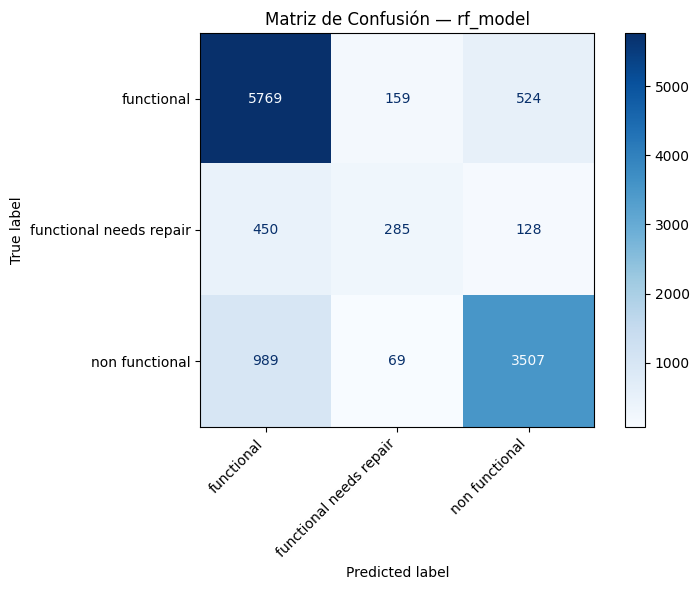

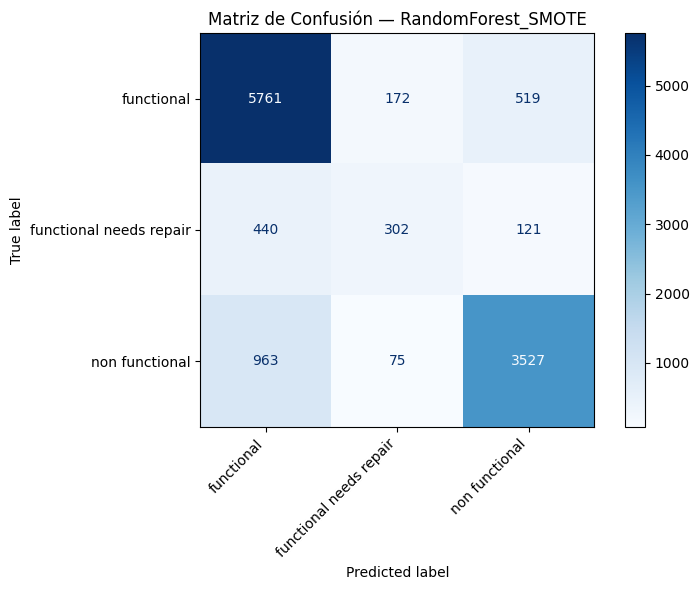

#### **CatBoostClassifier base (cb_model)**
En este punto ya no estoy logrando mejorar el modelo RanfomForest (ya hemos probado balanceo de datos, finetunning de hiperparámetros, feature engineering...)  

Así que, decidimos probar CarBoostClassifier porque, según e investigado, a menudo supera a RandomForest cuando hay variables categóricas con alta cardinalidad (como es el caso).

**Resultados**
- accuracy en local test: 0.8013
- accuracy en competition: 0.8191

In [594]:
from catboost import CatBoostClassifier

# Dividimos el dataset en X e y
X = clean_df_train.drop(columns='target')
y = clean_df_train['target']

# Listado de variables categóricas
cat_features = X.select_dtypes(include=["object", "category"]).columns.tolist()

# Dividimos los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=123)

# Instanciamos el modelo
cb_model = CatBoostClassifier(
    iterations=1000,
    learning_rate=0.05,
    depth=6,
    cat_features=cat_features,
    verbose=100,
    random_state=123
)

# Entrenamos el modelo
cb_model.fit(X_train, y_train)

# Evaluamos el modelo
y_pred = cb_model.predict(X_test)
acc = accuracy_score(y_test, y_pred)
print(f"Acc: {acc:.6f}")

0:	learn: 1.0579108	total: 321ms	remaining: 5m 21s
100:	learn: 0.5474559	total: 22.6s	remaining: 3m 20s
200:	learn: 0.5210645	total: 44.9s	remaining: 2m 58s
300:	learn: 0.5077379	total: 1m 7s	remaining: 2m 36s
400:	learn: 0.4983254	total: 1m 31s	remaining: 2m 17s
500:	learn: 0.4913824	total: 1m 55s	remaining: 1m 55s
600:	learn: 0.4855680	total: 2m 19s	remaining: 1m 32s
700:	learn: 0.4805979	total: 2m 41s	remaining: 1m 8s
800:	learn: 0.4756792	total: 3m 5s	remaining: 46.1s
900:	learn: 0.4708684	total: 3m 29s	remaining: 23s
999:	learn: 0.4667378	total: 3m 50s	remaining: 0us
Acc: 0.801347


En este caso **no hemos utilizado `cross_val_score`** por que resulta mucho más lento y costoso a nivel comuptacional. Por la naturaleza del algoritmo (CatBoost es un modelo de boosting secuencial) entrena árbol tras árbol (1000 iteraciones por arbol), y cada nuevo árbol depende de la salida de los anteriores.

Random Forest construye cada árbol de forma independiente y en paralelo. Cada llamado a fit() crea 100 árboles con máxima paralelización.

Si nuestro RandomForest usa n_estimators=100 y CatBoost iterations=1000, estamos entrenando 10 veces más 'modelos base' en CatBoost.

Por agilidad, probamos directamente el resultado del accuracy en la competicón. Y hemos obtenido la mejor performance hasta el momento. Así que nos quedaremos con este modelo por el momento.

**Salvado del modelo CatBoostClassifier_20250403 en MLFlow**

In [ ]:
# with mlflow.start_run(run_name="CatBoostClassifier_20250430"):
#     # Log del dataset depurado (guardado como archivo CSV)
#     clean_df.to_csv("clean_df_final.csv", index=False)
#     mlflow.log_artifact("clean_df_final.csv", artifact_path="data")

#     # Log del modelo
#     mlflow.sklearn.log_model(cb_model, "cb_model_final")
    
#     # Log de la métrica de precisión
#     mlflow.log_metric("accuracy", acc)
    
#     # Log de los parámetros del modelo
#     if hasattr(cb_model, "get_params"):
#         params = cb_model.get_params()
#         mlflow.log_params(params)

#     print(f"Modelo registrado con precisión: {acc}")

2025/04/30 19:33:39 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Modelo registrado con precisión: 0.8013468013468014


**Predicciones con CatBoost Model (cb_model)**

In [ ]:
# Entrenamos el modelo con el dataset completo.
cb_model = cb_model.fit(X, y)

0:	learn: 1.0563097	total: 241ms	remaining: 4m
100:	learn: 0.5448310	total: 26.4s	remaining: 3m 54s
200:	learn: 0.5188784	total: 1m 11s	remaining: 4m 42s
300:	learn: 0.5043249	total: 1m 41s	remaining: 3m 54s
400:	learn: 0.4965268	total: 2m 13s	remaining: 3m 18s
500:	learn: 0.4905628	total: 2m 41s	remaining: 2m 40s
600:	learn: 0.4849275	total: 3m 9s	remaining: 2m 5s
700:	learn: 0.4803873	total: 3m 37s	remaining: 1m 32s
800:	learn: 0.4761290	total: 4m 4s	remaining: 1m
900:	learn: 0.4721786	total: 4m 32s	remaining: 30s
999:	learn: 0.4684012	total: 4m 58s	remaining: 0us


In [ ]:
# Eliminamos la columna target
clean_df_predict = clean_df_predict.drop(columns=['target'])

# Hacemos la predicción
submission = cb_model.predict(clean_df_predict)

# guardamos la predicción en un DataFrame con el id (índice)y la predicción
submission_df = pd.DataFrame(submission, index=clean_df_predict.index, columns=['status_group'])

submission_df

,status_group
id,
50785,functional
51630,functional
17168,functional
45559,non functional
49871,functional
...,...
39307,non functional
18990,functional
28749,functional


In [ ]:
# # Guardamos la predicción en un archivo CSV
# submission_df.to_csv('submission_test12_cb.csv')

#### **CatBoost + Balanceo de datos** (descartado)
Probamos balanceo de datos, aplicando oversampling para aumentar sintéticamente el número de registros de la categoría 'functional needs repair' hasta el 30% de 'functional'.

Para aplicar balanceo de datos, esta vez, hemos utilizado `SMOTENC` (la versión de SMOTE para mix numérico+categoría) en lugar de SMOTE.  

**SMOTENC**:
1. Identifica qué columnas son categóricas (por índice).
2. No interpola sobre ellas, sino que re-samplea de forma consistente.
3. Nos devuelve un X_res, y_res que podemos pasarle directamente a CatBoost (indicándole de nuevo las columnas categóricas).

**Resultados**  
- accuracy en local test: 0.7916. Consecuentemente, en este caso **descartamos el balanceo de datos**.

In [ ]:
# # IMPORTANTE: Sí activamos este bloque, podemos encontrar problemas más adelante 
# # porque transformamos las variables categóricas X_train[cat_features] a string 
# # para evitar problemas con SMOTENC

# from imblearn.over_sampling import SMOTENC
# # Pasamos todas las variables categóricas de X_train a tipo string (para evitar problemas con SMOTENC)
# X_train[cat_features] = X_train[cat_features].astype(str)

# # Definimos la estrategia de resampleo sampling_strategy
# counts   = y_train.value_counts()
# majority = counts.max()
# target_n = int(0.3 * majority)
# sampling_strategy = {
#     cls: target_n
#     for cls, cnt in counts.items()
#     if cnt < target_n
# }

# # Resampleamos el dataset de entrenamiento con SMOTENC
# sm = SMOTENC(
#     categorical_features=cat_features,
#     sampling_strategy=sampling_strategy,
#     random_state=123
# )
# X_res, y_res = sm.fit_resample(X_train, y_train)

# # Entrenamos el modelo con el dataset resampleado
# cb_model_sm = CatBoostClassifier(
#     iterations=1000,
#     learning_rate=0.05,
#     depth=6,
#     cat_features=cat_features,
#     verbose=100,
#     random_state=123
# )
# cb_model_sm.fit(X_res, y_res)

# # Evaluamos
# y_pred = cb_model_sm.predict(X_test)
# acc = accuracy_score(y_test, y_pred)
# print(f"Accuracy: {acc:.4f}")

#### **Prueba CatBoost + early stopping (early_cb_model)**
En los últimos intentos, hemos observado que aunque aumentamos el accuracy en train (haciendo feature engineering), después obtenemos peores resultados en la competición. Pensamos entonces que el problema puede ser el overfiting del modelo, que se esté ajustando demasiado a los datos de train, empeorando consecuentemente la performance en test(competition). Así que decidimos probar *early stopping* para prevenir el overfiting del modelo CatBoost.

**Resultados**  
- bestTest = 0.7998316498
- bestIteration = 386
- Accuracy en competición: 0.8142


Para evitrar el sobreajuste del modelo, utilizaremos `early_stopping_rounds`. La 'detención temprana' es una técnica que detiene el entrenamiento cuando el rendimiento del modelo en el conjunto de validación deja de mejorar, evitando así el sobreajuste.

Para esto es necesario establecer un subconjunto de validación dentro del conjunto de train `eval_set=(X_test, y_test)`. Este conjunto de datos se utiliza durante el entrenamiento para supervisar el rendimiento del modelo en cada iteración, permitiendo así la detención temprana. 

El parámetro `use_best_model=True`, garantiza que el modelo conserve el estado de la iteración donde obtuvo el mejor rendimiento en el conjunto de validación. Esto garantiza que el modelo final sea la versión más efectiva en test encontrada durante el entrenamiento.

In [ ]:
# Dividimos el dataset en X e y
X = clean_df_train.drop(columns='target')
y = clean_df_train['target']

# Listado de variables categóricas
cat_features = X.select_dtypes(include=["object", "category"]).columns.tolist()

# Establecemos el subconjunto de validación
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=123)

# Instanciamos el modelo utilizando early_stopping_rounds=50
# esto detendrá el entrenamiento si la métrica en validación no mejora tras 50 iteraciones
earlycb_model = CatBoostClassifier(
    iterations=1000,
    learning_rate=0.05,
    depth=6,
    l2_leaf_reg=3,
    random_strength=1,
    bootstrap_type='Bernoulli',
    subsample=0.8,
    eval_metric='Accuracy',
    early_stopping_rounds=50, 
    cat_features=cat_features,
    verbose=100,
    random_state=123
)

# Entrenamos estableciendo el conjunto de validación: eval_set
earlycb_model.fit(
    X_train, y_train,
    eval_set=(X_test, y_test), # Datos de validación para el early stopping.
    use_best_model=True # Guardamos el modelo en su mejor iteración.
)

# 5) Métricas de sobreajuste
train_acc = earlycb_model.score(X_train, y_train)
test_acc = earlycb_model.score(X_test, y_test)

print("Train Accuracy:", train_acc)
print("Test Accuracy: ", test_acc)

0:	learn: 0.7271675	test: 0.7281987	best: 0.7281987 (0)	total: 258ms	remaining: 4m 17s
100:	learn: 0.7818813	test: 0.7878788	best: 0.7878788 (100)	total: 21.3s	remaining: 3m 9s
200:	learn: 0.7908249	test: 0.7946970	best: 0.7946970 (200)	total: 43s	remaining: 2m 51s
300:	learn: 0.7963594	test: 0.7989899	best: 0.7989899 (299)	total: 1m 3s	remaining: 2m 27s
400:	learn: 0.7992635	test: 0.7996633	best: 0.7998316 (386)	total: 1m 22s	remaining: 2m 3s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.7998316498
bestIteration = 386

Shrink model to first 387 iterations.
Train Accuracy: 0.8654671717171717
Test Accuracy:  0.7998316498316498


In [ ]:
# Seleccionamos la mejor iteración
best_iter = earlycb_model.get_best_iteration()  
print(f"Mejor iteración: {best_iter}")

Mejor iteración: 386


In [ ]:
# Reentrenamos con todo el dataset completo, indicando el número de iteraciones óptimo
earlycb_model = CatBoostClassifier(
    iterations=best_iter,
    learning_rate=0.05,
    depth=6,
    l2_leaf_reg=3,
    random_strength=1,
    bootstrap_type='Bernoulli',
    subsample=0.8,
    cat_features=cat_features,
    verbose=0,  # silencia el log    
    random_state=123
)

earlycb_model.fit(X, y)

**Predicciones con CatBoost Model + early_stopping (early_cb_model)**

In [ ]:
# # Eliminamos la columna target
# clean_df_predict = clean_df_predict.drop(columns=['target'])

# Hacemos la predicción
early_submission = earlycb_model.predict(clean_df_predict)

# guardamos la predicción en un DataFrame con el id (índice)y la predicción
early_submission_df = pd.DataFrame(early_submission, index=clean_df_predict.index, columns=['status_group'])

early_submission_df

,status_group
id,
50785,functional
51630,functional
17168,functional
45559,non functional
49871,functional
...,...
39307,non functional
18990,functional
28749,functional


In [ ]:
# # Guardamos la predicción en un archivo CSV
# early_submission_df.to_csv('submission_earlycb.csv')

#### **Conclusiones Early Stopping**  

En el primer modelo (cb_model), sin early stopping, permitimos que CatBoost entrenara hasta 1 000 iteraciones. Esto le permitió captar patrones complejos, pero también lo hizo más susceptible a sobreajustarse (overfitting) al conjunto de entrenamiento. Al reducir el sesgo (aprendiendo más detalles del dataset), se incrementó la varianza, lo que significa que el modelo pudo haber aprendido ruido específico del entrenamiento en lugar de patrones generalizables.

Al implementar early stopping, el entrenamiento se detiene antes de llegar a las 1 000 iteraciones, evitando que el modelo se vuelva excesivamente complejo. Esto reduce la varianza (el modelo ya no memoriza tanto el ruido de los datos), pero a la vez aumenta el sesgo: el modelo se vuelve más conservador y puede no capturar patrones débiles presentes en los datos originales.

**Impacto en la competición**  
El aumento del sesgo llevó al modelo a una configuración más restringida, donde no aprendió ciertos matices que aparentemente sí estaban presentes en el conjunto oculto de la competición. Como resultado, aunque el accuracy en local test mejoró, la capacidad del modelo para generalizar con los datos de la competición empeoró, causando una caída en el rendimiento final en el leaderboard.

#### **CatBoost + CrossValidation + early stopping (cbcv_model)**
Decidimos utilizar `catboost.cv` para evaluar el modelo con validación cruzada estratificada de 5 folds. Evitamos así confiar en un solo train/test split que puede sub- o sobre-estimarse en función de la partición aleatoria. Este enfoque permite estimar el rendimiento del modelo de manera más robusta sin necesidad de dividir manualmente el conjunto de datos.

Durante la validación, aplicamos `early_stopping_rounds = 50`, para aprovechar early stopping en cada fold y recuperar la mejor iteración promedio.

Finalmente, reentrenamos el modelo sobre el dataset de entrenamiento completo utilizando la cantidad óptima de iteraciones (iterations=710).

**Resultaados**  
- Mejor accuracy promedio: 0.8057 (710 iterations)
- Accuracy en competicion: 0,8176

Aunque este modelo no logró superar la puntuación del modelo base (cb_model), sí redujo significativamente la brecha entre la validación local y el rendimiento en la competición, lo que indica una mejor generalización y menor riesgo de sobreajuste. Es un enfoque más robusto desde el punto de vista metodológico, aunque en este caso concreto el modelo base logró ajustarse mejor a los datos de prueba de la competición.

In [ ]:
from catboost import Pool, cv

# Dividimos el dataset en X e y
X = clean_df_train.drop(columns='target')
y = clean_df_train['target']

# Listado de variables categóricas
cat_features = X.select_dtypes(include=["object", "category"]).columns.tolist()

# Preparamos el Pool con los datos de entrenamiento
pool = Pool(
    data=X,
    label=y,
    cat_features=cat_features
)

# Definimos los parámetros (sin un número fijo de iteraciones)
params = {
    'loss_function': 'MultiClass',
    'eval_metric':   'Accuracy',
    'learning_rate': 0.05,
    'depth':         6,
    'l2_leaf_reg':   3,
    'random_strength': 1,
    'bootstrap_type':  'Bernoulli',
    'subsample':       0.8,
    'random_seed':     123,
    'verbose':         False,
    'early_stopping_rounds': 50
}

# Ejecutamos la validación cruzada CV de CatBoost
cv_results = cv(
    params      = params,
    pool        = pool,
    fold_count  = 5,
    stratified  = True,
    partition_random_seed = 123,
    verbose     = 100
)

# cv_results es un DataFrame con columnas test-Accuracy-mean, test-Accuracy-std, etc.
# Seleccionamos la mejor iteración
best_iter = cv_results['test-Accuracy-mean'].idxmax() + 1  # +1 porque idx es cero-based
best_score = cv_results['test-Accuracy-mean'].max()

print(f"Mejor Accuracy CV: {best_score:.4f} en iteración {best_iter}")

# Entrenamos el modelo final con todas las muestras y el best_iter
cbcv_model = CatBoostClassifier(
    **params,
    iterations=best_iter
)
cbcv_model.fit(pool)

Training on fold [0/5]
0:	learn: 0.7191018	test: 0.7286424	best: 0.7286424 (0)	total: 250ms	remaining: 4m 10s
100:	learn: 0.7785096	test: 0.7950509	best: 0.7953876 (99)	total: 20.3s	remaining: 3m
200:	learn: 0.7868011	test: 0.8036361	best: 0.8038044 (199)	total: 40s	remaining: 2m 39s
300:	learn: 0.7934300	test: 0.8091070	best: 0.8095278 (292)	total: 59.7s	remaining: 2m 18s

bestTest = 0.8102011615
bestIteration = 335

Training on fold [1/5]
0:	learn: 0.7194385	test: 0.7271273	best: 0.7271273 (0)	total: 219ms	remaining: 3m 38s
100:	learn: 0.7817925	test: 0.7857924	best: 0.7857924 (100)	total: 19.5s	remaining: 2m 53s
200:	learn: 0.7902944	test: 0.7914317	best: 0.7921892 (169)	total: 39.1s	remaining: 2m 35s
300:	learn: 0.7955555	test: 0.7959768	best: 0.7959768 (299)	total: 59s	remaining: 2m 17s
400:	learn: 0.7990278	test: 0.7980810	best: 0.7982493 (398)	total: 1m 22s	remaining: 2m 2s

bestTest = 0.7989226496
bestIteration = 440

Training on fold [2/5]
0:	learn: 0.7232744	test: 0.7261785	b

**Predicciones con CatBoostCV + early_stopping (cbcv_model)**

In [ ]:
# # Eliminamos la columna target
# clean_df_predict = clean_df_predict.drop(columns=['target'])

# Hacemos la predicción
cbcv_submission = cbcv_model.predict(clean_df_predict)

# guardamos la predicción en un DataFrame con el id (índice)y la predicción
cbcv_submission_df = pd.DataFrame(cbcv_submission, index=clean_df_predict.index, columns=['status_group'])

cbcv_submission_df

,status_group
id,
50785,functional
51630,functional
17168,functional
45559,non functional
49871,functional
...,...
39307,non functional
18990,functional
28749,functional


In [ ]:
# # # Guardamos la predicción en un archivo CSV
# cbcv_submission_df.to_csv('submission_cbcv.csv')

#### **CatBoost + RandomizedSearchCV + EarlyStopping**
Hacer *fine tunning* de hiperparámetros consume una grán cantidad de recursos y tiempo. Así que optamos por hacer una prubea de ajuste de hiperparámetros con `RandomizedSearchCV`. Que solo prueba algunas combinaciones aleatorias partiendo del grid que planteamos (aún así ha tardado 550minutos).

1. Proponemos un param_grid (o espacio de búsqeuda de hiperparámetros) para GridSearchCV y entrenamos 20(n_iters)x3(folds)= 60 "modelos". 20 combinaciones de parámetros con 3 subconjuntos de validación cruzada. De este entrenamiento obtenemos los **Mejores parámetros: {'subsample': 0.8, 'random_strength': 0.5, 'learning_rate': 0.07, 'l2_leaf_reg': 1, 'iterations': 1000, 'depth': 6, 'bootstrap_type': 'Bernoulli'}**

2. Entrenamos un modelo (cbgrid_model) con estos parámetros + early_stopping que nos devuelve un bestTest = 0.8005892256 en la bestIteration = 296

3. Por último reentrenamos el modelo con el dataset de entrenamiento completo. Pero decidimos probar dos opciones:  
3.1. **cbgrid_model** - con todos los datos y el número óptimo de iteraciones según early stopping (295)  
3.2. **cbgrid1000_model** - con todos los datos y 1000 iteraciones (haciendo caso omiso de early stopping).  
Esta comparación se diseñó para evaluar si el early stopping realmente estaba ayudando a generalizar mejor, o si estaba limitando demasiado la capacidad del modelo de aprender patrones útiles del conjunto completo de entrenamiento.

**Resultados**  
- bestTest = 0.8005892256
- bestIteration = 296
- accuracy en competición (296 iterations): 0,8154
- accuracy en competición (1000 iterations): **0,8206** **Mejor performance conseguida**

**Conclusión**  
El uso de RandomizedSearchCV fue clave para encontrar una configuración óptima de hiperparámetros que mejoró de forma clara el rendimiento del modelo. Además, los resultados sugieren que, en este caso, omitir el early stopping y permitir al modelo entrenar más iteraciones fue beneficioso, posiblemente porque el conjunto de test tenía una distribución similar al de entrenamiento, permitiendo cierto grado de sobreajuste sin penalización.

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

# Dividimos el dataset en X e y
X = clean_df_train.drop(columns='target')
y = clean_df_train['target']

# Listamos las variables categóricas
cat_features = X.select_dtypes(include=["object", "category"]).columns.tolist()
for col in cat_features:
    X[col] = X[col].astype('category')

# Establecemos el subconjunto de validación
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=123)

# Definimos el espacio de búsqueda de hiperparámetros
param_grid = {
    'iterations': [500, 800, 1000],
    'learning_rate': [0.03, 0.05, 0.07],
    'depth': [5, 6],
    'l2_leaf_reg': [1, 3],
    'random_strength': [0.5, 1],
    'subsample': [0.7, 0.8],
    'bootstrap_type': ['Bernoulli'],
}

# Instanciamos el modelo base
cb = CatBoostClassifier(
    loss_function='MultiClass',
    eval_metric='Accuracy',
    cat_features=cat_features,
    verbose=0,
    random_seed=123
)

# Definimos los parámetros de RandomizedSearchCV
random_search = RandomizedSearchCV(
    cb,
    param_distributions=param_grid,
    n_iter=20, # n combinaciones a probar
    scoring='accuracy',
    cv=3, # n folds para validación cruzada
    verbose=1,
    n_jobs=-1,
    random_state=123
)

# Entrenamos el modelo con RandomizedSearchCV
random_search.fit(X_train, y_train)

print("Mejores parámetros:", random_search.best_params_)


# Entrenamos un modelo con los mejores parámetros encontrados + early_stopping
best_params = random_search.best_params_.copy()
best_params.update({
    'loss_function': 'MultiClass',
    'eval_metric': 'Accuracy',
    'cat_features': cat_features,
    'early_stopping_rounds': 50,
    'verbose': 100,
    'random_seed': 123
})

cbgrid_model = CatBoostClassifier(**best_params)
cbgrid_model.fit(
    X_train, y_train,
    eval_set=(X_test, y_test),
    use_best_model=True
)

# Evaluación del modelo
y_pred = cbgrid_model.predict(X_test)
print("Accuracy final en validación:", accuracy_score(y_test, y_pred))

# Iteración óptima
best_iter = cbgrid_model.get_best_iteration()
print("Mejor iteración encontrada:", best_iter)


Fitting 3 folds for each of 20 candidates, totalling 60 fits


/Users/antoniotrapote/Documents/VSCode/ucm/machine_learning/.venv/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Mejores parámetros: {'subsample': 0.8, 'random_strength': 0.5, 'learning_rate': 0.07, 'l2_leaf_reg': 1, 'iterations': 1000, 'depth': 6, 'bootstrap_type': 'Bernoulli'}
0:	learn: 0.7285143	test: 0.7317340	best: 0.7317340 (0)	total: 331ms	remaining: 5m 30s
100:	learn: 0.7877736	test: 0.7897306	best: 0.7898148 (98)	total: 33.4s	remaining: 4m 57s
200:	learn: 0.7965699	test: 0.7983165	best: 0.7985690 (196)	total: 1m 10s	remaining: 4m 42s
300:	learn: 0.8023990	test: 0.8004209	best: 0.8005892 (296)	total: 1m 47s	remaining: 4m 8s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.8005892256
bestIteration = 296

Shrink model to first 297 iterations.
Accuracy final en validación: 0.8005892255892256
Mejor iteración encontrada: 296


*ha tardado 545m  43.8s*

Fitting 3 folds for each of 20 candidates, totalling 60 fits

**Mejores parámetros**: {'subsample': 0.8, 'random_strength': 0.5, 'learning_rate': 0.07, 'l2_leaf_reg': 1, 'iterations': 1000, 'depth': 6, 'bootstrap_type': 'Bernoulli'}  

0:	learn: 0.7285143	test: 0.7317340	best: 0.7317340 (0)	total: 291ms	remaining: 4m 51s  
100:	learn: 0.7877736	test: 0.7897306	best: 0.7898148 (98)	total: 20s	remaining: 2m 57s  
200:	learn: 0.7965699	test: 0.7983165	best: 0.7985690 (196)	total: 43.3s	remaining: 2m 52s  
300:	learn: 0.8023990	test: 0.8004209	best: 0.8005892 (296)	total: 1m 6s	remaining: 2m 35s  
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.8005892256
bestIteration = 296

Shrink model to first 297 iterations.  
Accuracy final en validación: 0.8005892255892256  
Mejor iteración encontrada: 296

**1. cbgrid_model: Entrenamos el modelo con todos los datos y el número óptimo de iteraciones según early stopping (295)**

In [ ]:
# Entrenamos el modelo final con todo el dataset y los parámetros de RandomizedSearchCV ('iterations'=295)
early_params = random_search.best_params_.copy()
early_params.update({
    'iterations': best_iter,  # sustituimos el valor de 'iterations' por el obtenido con early stopping
    'cat_features': cat_features,
    'verbose': 100,
    'random_seed': 123
})

cbgrid_model = CatBoostClassifier(**early_params)
cbgrid_model.fit(X, y)

0:	learn: 1.0401527	total: 255ms	remaining: 1m 15s
100:	learn: 0.5240961	total: 23.8s	remaining: 45.9s
200:	learn: 0.4979801	total: 49.4s	remaining: 23.3s
295:	learn: 0.4857619	total: 1m 13s	remaining: 0us


**2. cbgrid1000_model: Entrenamos el modelo con todos los datos, pero 1000 iteraciones.**

In [ ]:
# Entrenamos el modelo final con todo el dataset y los parámetros de RandomizedSearchCV ('iterations'=1000)
params_no_early = random_search.best_params_.copy()
params_no_early.update({
    'cat_features': cat_features,
    'verbose': 100,
    'random_seed': 123
})

cbgrid1000_model = CatBoostClassifier(**params_no_early)
cbgrid1000_model.fit(X, y)

0:	learn: 1.0401527	total: 443ms	remaining: 7m 22s
100:	learn: 0.5240961	total: 23.8s	remaining: 3m 32s
200:	learn: 0.4979801	total: 49.8s	remaining: 3m 17s
300:	learn: 0.4852036	total: 1m 12s	remaining: 2m 49s
400:	learn: 0.4767975	total: 1m 37s	remaining: 2m 25s
500:	learn: 0.4693272	total: 2m 3s	remaining: 2m 2s
600:	learn: 0.4620218	total: 2m 26s	remaining: 1m 37s
700:	learn: 0.4557038	total: 2m 54s	remaining: 1m 14s
800:	learn: 0.4494910	total: 3m 18s	remaining: 49.4s
900:	learn: 0.4440798	total: 3m 43s	remaining: 24.6s
999:	learn: 0.4382518	total: 4m 14s	remaining: 0us


**Predicciones CatBoost + GridSearchCV: con y sin early stop**

In [ ]:
# # Eliminamos la columna target
# clean_df_predict = clean_df_predict.drop(columns=['target'])

### 1. Modelo con early stopping (cbgrid_model)
submission_cbgrid_early = cbgrid_model.predict(clean_df_predict)
submission_cbgrid_early_df = pd.DataFrame(submission_cbgrid_early, index=clean_df_predict.index, columns=['status_group'])
submission_cbgrid_early_df.to_csv('submission_cbgrid_early.csv')

### 2. Modelo sin early stopping (1000 iteraciones) (cbgrid1000_model)
submission_cbgrid_no_early = cbgrid1000_model.predict(clean_df_predict)
submission_cbgrid_no_early_df = pd.DataFrame(submission_cbgrid_no_early, index=clean_df_predict.index, columns=['status_group'])
submission_cbgrid_no_early_df.to_csv('submission_cbgrid_no_early.csv')

**Salvamos en MLFlow el cbgrid1000_model**

In [ ]:
# with mlflow.start_run(run_name="CatBoost_GridSearchCV_20250507"):
#     # Log del dataset depurado (guardado como archivo CSV)
#     clean_df.to_csv("clean_df_cbgrid1000_model.csv", index=False)
#     mlflow.log_artifact("clean_df_cbgrid1000_model.csv", artifact_path="data")

#     # Log del modelo
#     mlflow.sklearn.log_model(cbgrid1000_model, "cbgrid1000_model")
    
#     # Log de la métrica de precisión
#     mlflow.log_metric("accuracy", '0.8206')
    
#     # Log de los parámetros del modelo
#     if hasattr(cb_model, "get_params"):
#         params = cb_model.get_params()
#         mlflow.log_params(params)

#     print(f"Modelo registrado con precisión: 0.8206")

2025/05/07 20:52:17 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Modelo registrado con precisión: 0.8206


#### **Comparativa modelos CatBoost**

| Modelo                     | local Accuracy                  | Accuracy en competición |
| -------------------------- | ------------------------------- | ----------------------- |
| CatBoost base              | 0.8013                          | 0.8191                  |
| CatBoost + early stopping  | 0.7998 (best_iter 386)          | 0.8142                  |
| CatBoost + CV              | 0.8057 (best_iter 710)          | 0.8176                  |
| CB + RSCV + early stopping | 0.8005 (best_iter 296)          | 0.8154                  |
| CB + RSCV                  | ---                             | **0.8206**              |


**Interpretación**  
Aunque los modelos validados y regularizados (CV, early stopping, y búsqueda de hiperparámetros) mostraron mejores resultados de generalización en validación interna, el modelo base y el modelo con RandomizedSearch sin early stopping obtuvieron mayor precisión en la competición.

Esto puede explicarse por dos razones principales:

1. Trade-off sesgo-varianza:
La regularización (como early stopping) reduce la varianza, previniendo el sobreajuste. Sin embargo, también puede aumentar el sesgo, limitando la capacidad del modelo para ajustarse a detalles finos del conjunto de entrenamiento y, por extensión, del de prueba si comparten patrones similares.

2. Distribución de los datos del test público:
Es posible que el conjunto de test de la competición tenga una distribución muy similar al entrenamiento. Esto favorece a modelos con mayor capacidad de ajuste (incluso ligeramente sobreajustados), que captan mejor patrones específicos del conjunto de entrenamiento.

### **Conclusiones Finales: Por qué `cbgrid1000_model` es la mejor opción**

1. **Mejor rendimiento en la competición**  
    - El modelo `cbgrid1000_model` alcanzó un **accuracy de 0.8206 en la competición**, superando a todas las demás configuraciones probadas, incluyendo modelos con regularización como `early stopping` o validación cruzada (`cbcv_model`).

2. **Capacidad de aprendizaje más completa**  
    - Al entrenar durante **1000 iteraciones completas**, el modelo pudo capturar patrones más complejos en los datos, lo que resultó en un mejor ajuste a la distribución del conjunto de prueba de la competición. Esto sugiere que, en este caso, el sobreajuste no fue un problema significativo.

3. **Trade-off sesgo-varianza favorable**  
    - Aunque técnicas como `early stopping` reducen la varianza al prevenir el sobreajuste, también aumentan el sesgo, limitando la capacidad del modelo para aprender patrones específicos. En este caso, el modelo sin `early stopping` logró un mejor balance entre sesgo y varianza, maximizando su capacidad predictiva.

4. **Optimización de hiperparámetros**  
    - El uso de `RandomizedSearchCV` permitió encontrar una configuración óptima de hiperparámetros, como `learning_rate=0.07`, `depth=6` y `subsample=0.8`, que mejoraron significativamente el rendimiento del modelo.

5. **Robustez en datos categóricos**  
    - CatBoost está diseñado para manejar eficientemente variables categóricas con alta cardinalidad, como las presentes en este dataset. Esto lo hace más adecuado que otros modelos como Random Forest, especialmente en tareas de clasificación multiclase.

6. **Generalización adecuada**  
    - Aunque el modelo entrenado con validación cruzada (`cbcv_model`) mostró una mejor generalización en validaciones internas, el rendimiento en la competición indica que `cbgrid1000_model` logró capturar mejor los patrones relevantes para el conjunto de prueba.

En resumen, `cbgrid1000_model` es la mejor opción debido a su capacidad para maximizar el rendimiento en el entorno competitivo, aprovechando al máximo los datos disponibles y los hiperparámetros óptimos encontrados.

**Problema de Explicabilidad en Modelos Basados en Árboles de Decisión**

Los modelos basados en árboles de decisión, como Random Forest y CatBoost, son conocidos por su alta capacidad predictiva y robustez frente a datos complejos. Sin embargo, presentan un problema significativo: **la falta de interpretabilidad**. Estos modelos funcionan como una "caja negra", lo que dificulta entender cómo toman decisiones y qué variables tienen mayor impacto en las predicciones.

Para abordar este problema y aportar algo de luz sobre el funcionamiento interno del modelo, utilizaremos las siguientes herramientas:

1. **Reporte de clasificación y matriz de confusion**: El reporte de clasificación proporciona métricas clave como precisión, recall y F1-score para cada clase, lo que permite evaluar el rendimiento del modelo en términos de predicción correcta y errores. La matriz de confusión, por otro lado, muestra el desglose de predicciones correctas e incorrectas para cada clase, ayudando a identificar patrones de error específicos y posibles sesgos del modelo.

2. **Importancia de Variables**: Mostraremos las variables más relevantes según el modelo, lo que ayuda a entender qué características tienen mayor peso en las decisiones.

3. **SHAP**: Descompone las predicciones del modelo en contribuciones individuales de cada variable, proporcionando una explicación más detallada y local de las decisiones del modelo.

#### **Reporte de clasificacion y matriz de confusión**
Aunque el **accuracy global** es **muy bueno** (y por eso hemos logrado una buena puntuación en la competición), la categoría **Functional needs repair es claramente el punto débil del modelo**:

- Tiene un recall muy bajo (0.46), identifica menos de la mitad de los casos verdaderos.
- La precision (0.81) indica que, cuando predice esta clase, generalmente acierta, pero lo hace muy pocas veces.
- El f1-score (0.59) refleja el bajo equilibrio entre precisión y cobertura.

Una posible mejora futura sería: Aplicar técnicas de rebalanceo (como SMOTE). O tratar de afinar más el modelo específicamente para esa clase, o incluso crear un modelo especializado binario auxiliar para detectar "needs repair".

Reporte de Clasificación:
                         precision    recall  f1-score   support

             functional       0.86      0.96      0.91      6452
functional needs repair       0.81      0.46      0.59       863
         non functional       0.93      0.86      0.89      4565

               accuracy                           0.88     11880
              macro avg       0.87      0.76      0.79     11880
           weighted avg       0.88      0.88      0.88     11880



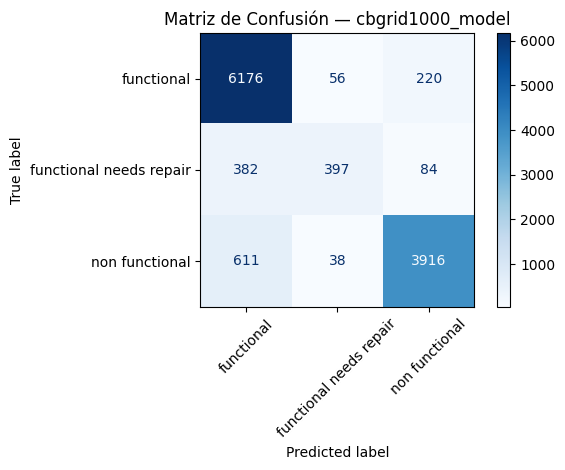

In [601]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Hacemos predicciones sobre el conjunto de test con el modelo final
y_pred = cbgrid1000_model.predict(X_test)

# Mostramos el reporte de clasificación
print("Reporte de Clasificación:")
print(classification_report(y_test, y_pred))

# Calculamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred, labels=cbgrid1000_model.classes_)

# Mostramos la matriz de confusión
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=cbgrid1000_model.classes_)
disp.plot(cmap="Blues", xticks_rotation=45)
plt.title("Matriz de Confusión — cbgrid1000_model")
plt.tight_layout()
plt.show()


#### **Importancia de variables**
El gráfico de importancia de variables ofrece una visión clara y accesible sobre qué características han tenido mayor peso en las decisiones del modelo. Esta información es clave tanto para la interpretación como para futuras optimizaciones del pipeline.

Uno de los resultados más llamativos —y en cierto modo desconcertantes— es la alta relevancia que alcanzan variables como 'ward' y 'lga', ambas con una altísima cardinalidad y asociadas principalmente a información geográfica muy granular. A priori, esperábamos que estas variables no aportaran demasiado valor. Sin embargo, el modelo ha identificado patrones consistentes en ellas, lo que sugiere que podría haber correlaciones implícitas entre ciertas ubicaciones y el estado de funcionamiento de los puntos de agua —quizás relacionadas con diferencias regionales en gestión, mantenimiento o infraestructura-. Esto nos plantea **una reflexión interesante**: lo que en una etapa inicial puede parecer ruido o complejidad innecesaria, puede contener información contextual valiosa que los modelos avanzados como CatBoost logran extraer de manera eficaz, sin necesidad de codificación manual ni agregaciones previas.

Por contraste, no nos sorprende ver a 'amount_tsh' (cantidad de agua disponible) en la cola del ranking. Sabíamos que, con más del 70% de sus valores en cero, su capacidad para discriminar entre clases sería limitada. Aun así, decidimos mantenerla, ya que su exclusión provocaba una ligera pérdida de precisión, probablemente debido a interacciones menores con otras variables.

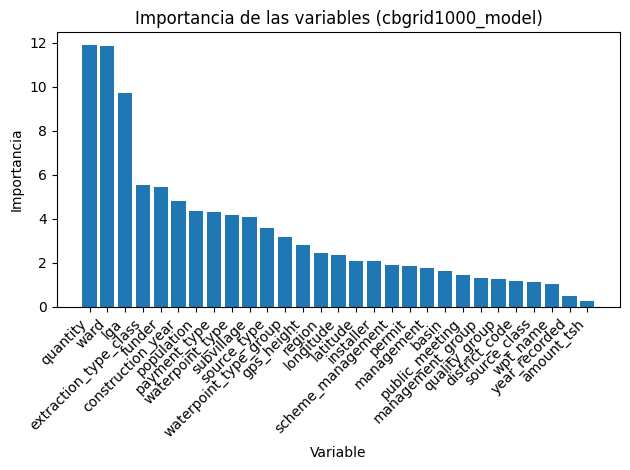

In [ ]:
import matplotlib.pyplot as plt

# Obtenemos la importancias y nombres de las variables
importances = cbgrid1000_model.get_feature_importance()
features    = X_train.columns.tolist()

# Creamos un DataFrame y lo ordenamos de mayor a menor
fi_df = pd.DataFrame({'feature': features, 'importance': importances}).sort_values('importance', ascending=False)

# Gráfico de barras de con las 
plt.figure()
plt.bar(fi_df['feature'], fi_df['importance'])
plt.xticks(rotation=45, ha='right')
plt.xlabel("Variable")
plt.ylabel("Importancia")
plt.title("Importancia de las variables (cbgrid1000_model)")
plt.tight_layout()
plt.show()

#### **Shap**

No he sido capaz de obtener un gráfico de dispersion (tipo “beeswarm” con puntos individuales por variable y clase) debido a una restricción de la librería SHAP, que solo permite plot_type='bar' en modelos clasificación multicalse :(

No estoy seguro entonces, de si este gráfico aporta realmente información relevante más allá de le extraemos del gráfico anterior.

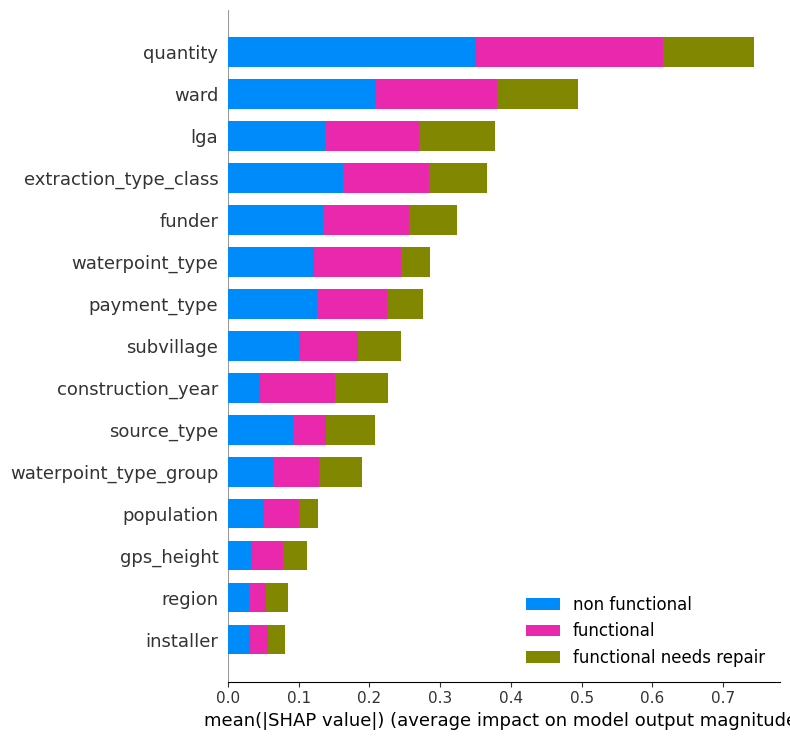

In [ ]:
import shap 

# Creamos el objeto explainer
explainer = shap.TreeExplainer(cbgrid1000_model)
# Calculamos los valores SHAP
shap_values = explainer.shap_values(X_train)
# Creamos el gráfico de resumen con nombres de las clases
class_names = cbgrid1000_model.classes_  # Obtenemos los nombres de las clases
shap.summary_plot(shap_values, X_train, plot_type="bar", max_display=15, class_names=class_names)


### **Ultima prueba quitando 'amount_tsh' y poniendo 'year_recorded' como categórica**
Despues de ver las feature_importance del mejor modelo, observo que la última feature en importancia es 'amount_tsh', que ya desde el principio no nos gustaba (70% de ceros), y me planteo hacer una pruebita eliminándola... pero apenas hay diferencia.

In [ ]:
# from sklearn.model_selection import RandomizedSearchCV

# # Preparamos los datos de prueba
# X_prueba = clean_df_train.drop(columns=['target', 'amount_tsh'])
# X_prueba['year_recorded'] = X_prueba['year_recorded'].astype('category')
# y = clean_df_train['target']

# # Listamos variables categóricas (en base a X_prueba)
# cat_features_prueba = X_prueba.select_dtypes(include=["object", "category"]).columns.tolist()

# # Dividimos en train/test
# X_train, X_test, y_train, y_test = train_test_split(X_prueba, y, stratify=y, test_size=0.2, random_state=123)

# # Entrenamos modelo
# cbgrid1000_model_EXTRA = CatBoostClassifier(
#                                 subsample= 0.8, 
#                                 random_strength= 0.5, 
#                                 learning_rate= 0.07, 
#                                 l2_leaf_reg= 1, 
#                                 iterations= 1000, 
#                                 depth= 6, 
#                                 bootstrap_type = 'Bernoulli',
#                                 cat_features=cat_features_prueba,
#                                 verbose=100,
#                                 random_seed=123
#                                 )
# cbgrid1000_model_EXTRA.fit(X_train, y_train)

# # Evaluamos el modelo
# y_pred = cbgrid1000_model_EXTRA.predict(X_test)
# print("Accuracy:", accuracy_score(y_test, y_pred))

0:	learn: 1.0395692	total: 213ms	remaining: 3m 33s
100:	learn: 0.5293747	total: 18.7s	remaining: 2m 46s
200:	learn: 0.5038267	total: 37.5s	remaining: 2m 29s
300:	learn: 0.4893957	total: 56s	remaining: 2m 10s
400:	learn: 0.4790042	total: 1m 14s	remaining: 1m 51s
500:	learn: 0.4693708	total: 1m 33s	remaining: 1m 33s
600:	learn: 0.4610118	total: 1m 52s	remaining: 1m 14s
700:	learn: 0.4535503	total: 2m 12s	remaining: 56.5s
800:	learn: 0.4462163	total: 2m 31s	remaining: 37.7s
900:	learn: 0.4395690	total: 2m 50s	remaining: 18.8s
999:	learn: 0.4330739	total: 3m 9s	remaining: 0us
Accuracy: 0.8054713804713804


In [ ]:
# # Reentrenamos el modelo con todo el dataset
# cbgrid1000_model_EXTRA.fit(X_prueba, y)

0:	learn: 1.0401889	total: 252ms	remaining: 4m 12s
100:	learn: 0.5248559	total: 22.1s	remaining: 3m 17s
200:	learn: 0.4988558	total: 45.1s	remaining: 2m 59s
300:	learn: 0.4860987	total: 1m 7s	remaining: 2m 37s
400:	learn: 0.4776351	total: 1m 30s	remaining: 2m 15s
500:	learn: 0.4703761	total: 1m 55s	remaining: 1m 55s
600:	learn: 0.4632725	total: 2m 20s	remaining: 1m 32s
700:	learn: 0.4569429	total: 2m 48s	remaining: 1m 12s
800:	learn: 0.4504825	total: 3m 15s	remaining: 48.6s
900:	learn: 0.4442924	total: 3m 40s	remaining: 24.2s
999:	learn: 0.4385977	total: 4m 3s	remaining: 0us


In [ ]:
# # Preparamos el dataset de predicción de la prueba
# clean_df_predict_prueba = clean_df_predict.drop(columns=['amount_tsh'])
# clean_df_predict_prueba['year_recorded'] = clean_df_predict_prueba['year_recorded'].astype('category')

# # Modelo de prueba sin 'amount_tsh' y year_recorded pasada a category
# submission_cbgrid_EXTRA = cbgrid1000_model_EXTRA.predict(clean_df_predict_prueba)
# submission_cbgrid_EXTRA_df = pd.DataFrame(submission_cbgrid_EXTRA, index=clean_df_predict.index, columns=['status_group'])
# submission_cbgrid_EXTRA_df.to_csv('submission_cbgrid1000_EXTRA.csv')

### **Memoria de intentos**  

1. **rf_test - accuracy en competición: 0.8066**  
-Utilicé RandomForestClassifier, por que es el que mejor resultados me dió en una primera aproximación con Pycaret.  
-Unicamente apliqué la transformacion *'date_recorded'* to *'year recorded'* (ver en el código)  
-Elimino: 'num_private', 'recorded_by', 'scheme_name' y 'quantity_group'.  
-Dataset de entrenamiento: clean_df4

2. **rf_test2_clean_df5 - accuracy en competición: 0.8116**  
-Empiezo a aplicar el feature engineering sobre todo el conjunto de datos. 
-'amount_tsh' > Pasamos los outliers a 0 y reagrupamos por decenas.  
-'longitude' y 'latitude' > detectados nulos enmascarados y los recodificamos.  
-Pasamos los nulos de las categóricas a 'unknown' ["scheme_management", "installer", "funder", "public_meeting", "permit" y "subvillage"]  
-'funder': juntamos 'none' '0' y 'unknown' / recodificamos los valores que llegan al percentil 95 como 'other'.  
-Elimino: 'num_private', 'recorded_by', 'scheme_name', 'quantity_group' + 'payment', 'water_quality', 'extraction_type_group', 'extraction_type', 'source' y 'region_code'  
-Tengo 3336 valores perdidos en variables categóricas, que el modelo RandomForest está gestionando de manera opaca... (pendiente de chequear)  
-Dataset de entrenamiento: clean_df5

3. **rf_test3 - accuracy en competición: 0.8125**  
-'scheme_management' > recodifico categorías minoritarias como 'Other'  
-'installer' > Recodificamos como 'other' los registros que están por debajo del percentil 98. Descubrimos algunos strings que apuntan a un mismo valor, los recodificamos manualmente.  
-Sigo teniendo por ahí 2 valores perdidos en variables categóricas.  
-Dataset de entrenamiento: clean_df6

4. **rf_test4 - accuracy en competición: 0.8154**  
-'wpt_name' > pruebo muchas cosas, pero no consigo mejoras. Imputo los 2 NaN, que estaban aquí, por la moda.  
-'construction_year'> pruebo a agrupar por decenas, no consigo mejoras. Se queda como estaba.  
-Como ya no tengo NaN/missings, elimino la imputación por la moda de las categóricas que tenía en el apartado de modelado, y queda el código un poco más limpio.  
-Dataset de entrenamiento: clean_df7 

5. **rf_test5 - accuracy en competición: 0.8154**  
-Este lo hice solo para chequear que no me había confundido al ejcutar el último script.  
-Dataset de entrenamiento: clean_df8

6. **rf_test6 - accuracy en competición: 0.8156**  
-En este intento, me dí cuenta de que estaba aplicando mal OrdinalEncoder. Porque estaba haciendo '.fit_transform' tanto en el training como en la predicción. Esto no era coherente. Por que si entreno el encoder con dos datasets diferentes, las transformaciones no son consistentes. Lo soluciono, pero tengo que incluir manejo de valores desconocidos, porque observo que en el dataser de prediccion hay valores que no aparecían en el entrenamiento.  
*encoder = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-999)*  
-Dataset de entrenamiento: clean_df8

7. **rf_test7 - accuracy en competición: 0.8175**  
-Aplico OrdinalEncoder antes del modelado, al final de la fase de Feature Engineering. 
Antes, estaba haciendo el fit del Ordinalencoder en la fase de entrenamiento (solo con el dataset de entrenamiento), esto provocaba que en la fase de predicción OrdinalEncoder, tomase muchos valores originales como desconocidos y los agrupase en una única categoría, empeorando así el rendimiento del modelo. Al ajustar el encoder con todos los datos disponibles, evito esta pérdida de información y mejoro la calidad de las predicciones.
-Además, mejoro considerablemente el manejo del Notebook (claridad y limpieza)
-Dataset de entrenamiento: clean_df9

8. **rf_test8 - accuracy en competición: 0,8172**  
-He intentado hacer Fine Tunning del modelo RandomForestClassifier, utilizando RandomizedSearchCV y GridSearchCV, pero no logro mejoras con respecto de los parámetros que veía utilizando (sugeridos por la primeras pruebas en PyCaret).  
-Intenté algunas cosas de Feature Engineering, aunque la mayoría me dieron peor accuracy score con el RandomForest.  
-Aplicando transformación logarítimica a la variable population, consigo una distribución normal. Aunque en principio en un modelo RandomForest esto no debería ser particularmente relevante, mejoraba ligerísimamente el score 0,81006734... pero al hacer la predicción obtenía un score peor en el concurso. Así que, descarto la transformación logarítica.

9. **cb_test1 - accuracy en competición: 0.8191**  
-Como estaba un poco atascado, y me estaba costando mucho mejorar el score con el modelo RandomForest, decido probar un modelo CatBoostClassifier, y he mejorado bastante el score! :)  
-Me da un accuracy peor 0.801346 en training, pero en la competición me ha dado el accuracy más alto que he conseguido 0.8191. 
-Además CatBoost no necesita OrdinalEncoder. CatBoost incorpora internamente un tratamiento especial para variables categóricas. Pasándole el listado cat_features, él modelo: Primero calcula estadísticas por categoría (por ejemplo, promedios condicionados al target) usando un esquema de orden aleatorio que evita fugas de información. Y después, genera internamente una codificación “óptima” (basada en orden, frecuencia, count, target-encoding, etc.) en cada iteración de los árboles.

10. **rfsm_test - accuracy en competición: 0.8175**  
-Pruebo la técnica de balanceo de datos aplicando (oversampling) a las categorías minoritarias.  
-En rf_model_sm (RandomForest): se mantiene el accuracy, pero mejora el recall de las categoráis minoritarias.
-En el cb_model (CatBoost) empeoro el accuracy si aplico el balanceo de datos. 

11. **cb_test2 - accuracy en competición: 0.8185**  
-Imputando los missings de las categóricas por la moda, mejoro el accuracy en training hasta 0.8023. Sin embargo al subir las predicciones en el concurso obtengo un accuracy peor. 

12. **cb_check - accuracy en competición: 0.8191**  
-Retomo el anterior tratamiento de los missings. Y me quedo con el modelo CatBoostClassifier sin balanceo de datos.  
-Guardado del modelo CatBoostClassifier_20250430 en MLFlow. Para no perder mi mejor modelo hasta la fecha.

13. **cb_test3 - accuracy en competición: 0.8166**  
-He probado pasando 'amounth_tsh' a categórica... Obtengo 0.8027 en train, pero peor resultado en la competición. Sospecho que estoy empezando a incurrir en overfiting del modelo.

14. **cb_test4 - accuracy en competición: 0.8180**  
-He probado a seleccionar algunas variables categóricas distintas (de las que eliminé por contener información redundante para evitar colinealidades): 'extraction_type_class' en lugar de 'extraction_type', y 'source' en lugar de 'source_type'.  
-Obtengo 0.8045 en train... ¿Estaré incurriendo en overfiting del modelo?

15. **cb_test5 - accuracy en competición: 0.8188** 
-No recuerdo que probé en esta ocasión...

16. **early_cb_test - accuracy en competición: 0.8160**
-Aplicamos early_stopping para evitar un seobreajuste excesivo del modelo.
-Test Accuracy:  0.7967 en iteracion 601
-He perdido los detalles de esta iteracion... :(

17. **cvcb_test - accuracy en competición: 0.8176** 
-Utilizamos CatBoost.cv (Validación Cruzada), para intentar encontrar un equilibrio entre sobreajuste y sesgo del modelo.
-Mejor Accuracy CV: 0.8057 en iteración 710

18. **early_cb_20250507 - accuracy en competición: 0.8142** 
-CatBoost + early stopping
-Aplicamos early_stopping para evitar un seobreajuste excesivo del modelo.
-Test Accuracy:  0.7998 |  (best_iter 386)

19. **cbgrid_early - accuracy en competición: 0.8154** 
-Esta vez, parece que el fine tunning de hiperparámetros (que ha llevado mucho tiempo y recursos computacionales) si que ha mejorado la performance del model. Aunque aplicando early_stop para evitar el overfiting del modelo, empeoramos los resultados en la competición, si no los aplicamos logramos la mejor performance

20. **cbgrid_1000 - accuracy en competición: 0.8206** 
-Mejor score conseguido en la competición. Parece que el modelo CatBoostClassfier + RandomSearchCV, han dado con el modelo más potente.

21. **cbgrid_1000_EXTRA - accuracy en competición: 0.8205** 
-Pruebo a eliminar la variable menos significativa para el modelo según cbgrid1000_model.get_feature_importance(), que es 'amount_tsh' (que no nos gustaba desde el principio con un 70% de ceros). Sin embargo obtengo una milésima menos de accuracy en competición. Si el fin fuese la aplicación real del modelo, personalmente eliminaría esta variable si no fuese posible obtener unos datos mejores, atendiendo al principio de parsimonia.

In [ ]:
# # Armamos el servidor de MLflow para consultar todos los modelos que hemos ido guardando.
# !mlflow ui

[2025-05-08 18:46:16 +0200] [38167] [INFO] Starting gunicorn 23.0.0
[2025-05-08 18:46:16 +0200] [38167] [INFO] Listening at: http://127.0.0.1:5000 (38167)
[2025-05-08 18:46:16 +0200] [38167] [INFO] Using worker: sync
[2025-05-08 18:46:16 +0200] [38168] [INFO] Booting worker with pid: 38168
[2025-05-08 18:46:16 +0200] [38169] [INFO] Booting worker with pid: 38169
[2025-05-08 18:46:16 +0200] [38170] [INFO] Booting worker with pid: 38170
[2025-05-08 18:46:17 +0200] [38171] [INFO] Booting worker with pid: 38171
^C

Aborted!
[2025-05-08 18:48:28 +0200] [38171] [INFO] Worker exiting (pid: 38171)
[2025-05-08 18:48:28 +0200] [38170] [INFO] Worker exiting (pid: 38170)
[2025-05-08 18:48:28 +0200] [38168] [INFO] Worker exiting (pid: 38168)
[2025-05-08 18:48:28 +0200] [38169] [INFO] Worker exiting (pid: 38169)


![Captura de pantalla 2025-05-08 a las 18.44.33.png](<attachment:Captura de pantalla 2025-05-08 a las 18.44.33.png>)
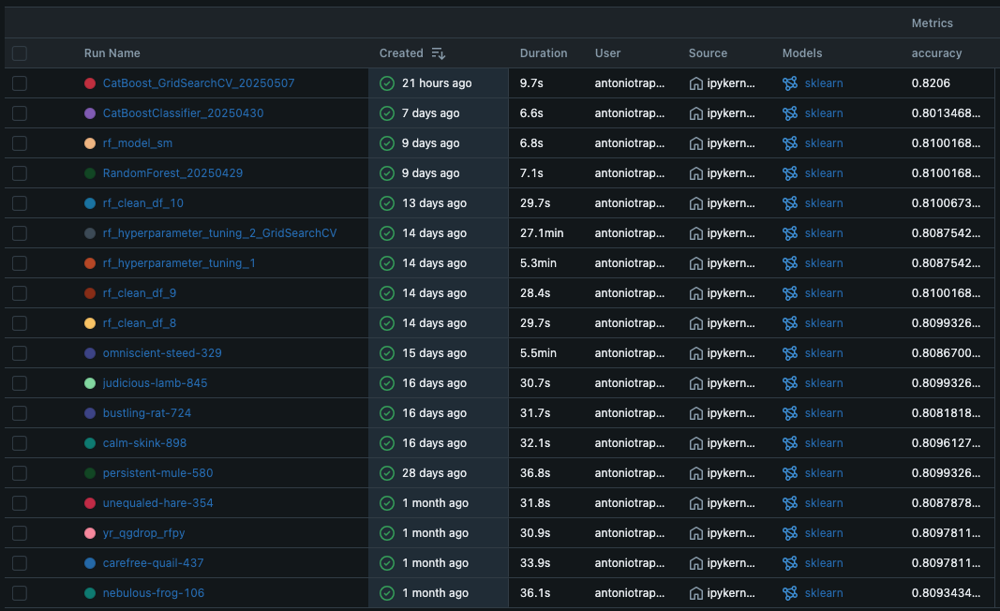

### **Mejor modelo (salvado)**  

He guardado un .pkl, requirements.txt, y el dataset depurado de entrenamiento.

![Captura de pantalla 2025-05-08 a las 18.47.39.png](<attachment:Captura de pantalla 2025-05-08 a las 18.47.39.png>)
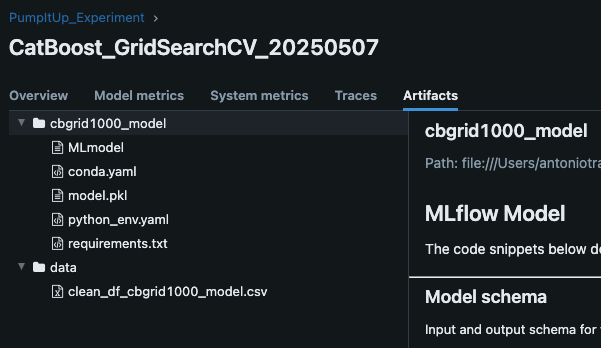

### **Pantallazo de la competición**
![Captura de pantalla 2025-05-07 a las 20.54.59.png](<attachment:Captura de pantalla 2025-05-07 a las 20.54.59.png>)

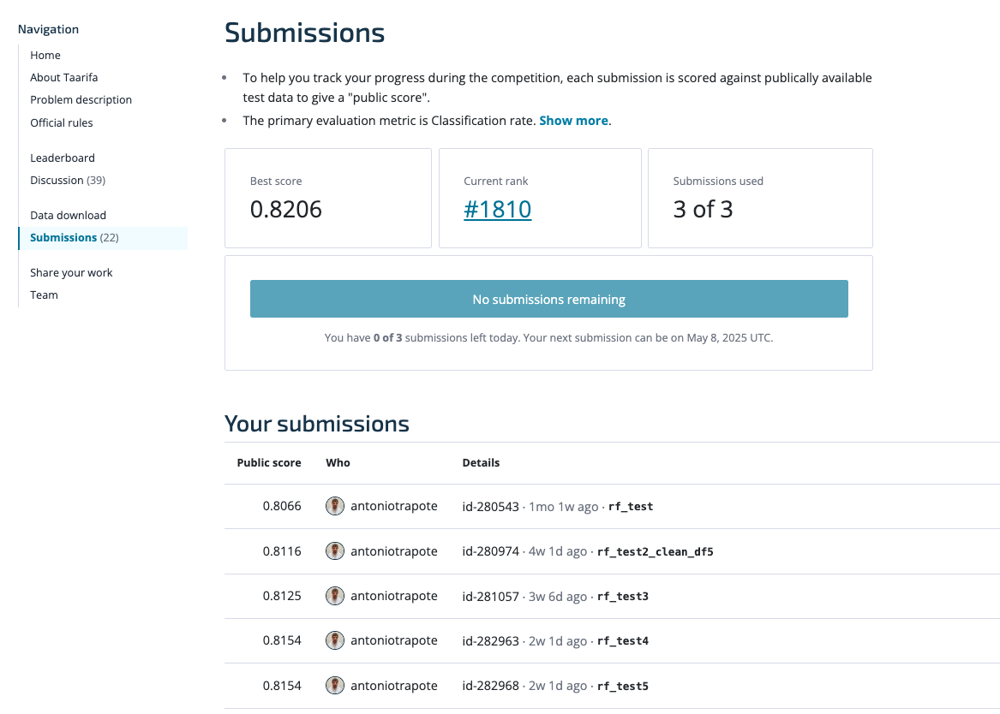

### **Posibles mejoras y aprendizajes**
- Quizá hubiese podido incluir más visualizaciones o gráficos generados manualmente en la parte del EDA, pero he concentrado mi tiempo y esfuerzo en hacer un feature engineering que me ha aportado grandes aprendizajes. Y también por supuesto en comprender las necesidades de cada modelo y aprender a base de ensayo y error muchas cuestiones de flujo y organización de trabajo (quiza cuestiones básicas, pero que para mi han sido muy relevantes teniendo en cuenta que empezé a trabajar con código con este master, y esta es una de mis primeras experiencias de caso 'real').

- En lo que se refiere al Feature engineering. Me queda la duda de cómo podrían trabajarse esas variables con altísima cardinalidad (que además han tenido un peso relevante en el modelo final como 'lga' o 'ward'). Por otra parte que pasa con tantos zeros y perdidos... si fuese un caso real, ¿habría que procurar un dato más consistente? 

- Hubiese sido interesante probar alguna técnica de seleccino automática de variables (las he utilizado en otros módulos, pero por tiempo no me ha dado tiempo en este)

- Hubiese sido interesante preparar un pipeline con las transforamciones, para que se pudiera aplicar facilmente en producción. (aunque hay bastantes transformaciones manuales puntuales, que dudo que sirviesen en un nuevo dataset genérico).

- Podría haber probado y comparado más modelos: XGBoost, Naive Bayer, Decision Tree... pero por economía del tiempo, decidí centrarme en los que pensé que me llevarían a obtener mejores resultados en la competición. Esto no significa que el aprendizaje no haya sido profundo y enriquecedor, puesto que me he tenido que enfrentar a muchas dificultades. Resolviendo muchos problemas que considero han sido un gran aprendizaje personal.